In [1]:
import os
import boto3
from dotenv import load_dotenv
import pandas as pd
import numpy as np
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import lightgbm as lgb
from catboost import CatBoostClassifier, Pool
from bayes_opt import BayesianOptimization

In [2]:
load_dotenv()

True

In [3]:
# Custom function to reduce memory usage of data

def reduce_mem_usage(df, verbose=True):
    numerics = ['int8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [4]:
AWS_S3_BUCKET = os.getenv("AWS_S3_BUCKET")
AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")

In [5]:
s3_client = boto3.client(
    "s3",
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

response = s3_client.get_object(Bucket=AWS_S3_BUCKET, Key="processed/tcga_processed.csv")

status = response.get("ResponseMetadata", {}).get("HTTPStatusCode")

if status == 200:
    print(f"Successful S3 get_object response. Status - {status}")
    input_df = reduce_mem_usage(pd.read_csv(response.get("Body")))
    print(input_df.info())
else:
    print(f"Unsuccessful S3 get_object response. Status - {status}")

Successful S3 get_object response. Status - 200
Mem. usage decreased to  0.56 Mb (86.3% reduction)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10017 entries, 0 to 10016
Data columns (total 54 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Primary_Site                                    10017 non-null  int8   
 1   Deceased_Status                                 10017 non-null  float16
 2   Prior_Malignancy                                10017 non-null  float16
 3   Synchronous_Malignancy                          10017 non-null  float16
 4   TP53                                            10017 non-null  int8   
 5   PIK3CA                                          10017 non-null  int8   
 6   TTN                                             10017 non-null  int8   
 7   CDH1                                            10017 non-null  int8   
 8   GATA3            

In [6]:
print(input_df.shape)
input_df.head()

(10017, 54)


,Primary_Site,Deceased_Status,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,APC,...,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white,Age_At_Diagnosis,Weight
0,0,0.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,9.601562,0.231201
1,0,0.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,6.378906,0.231201
2,0,0.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,16.750000,0.231201
3,0,0.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,16.046875,0.231201
4,0,0.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,14.046875,0.231201


In [7]:
cat_cols = input_df.drop(['Age_At_Diagnosis', 'Weight'], axis = 1)
cat_cols = cat_cols.astype('int8')
cat_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10017 entries, 0 to 10016
Data columns (total 52 columns):
 #   Column                                          Non-Null Count  Dtype
---  ------                                          --------------  -----
 0   Primary_Site                                    10017 non-null  int8 
 1   Deceased_Status                                 10017 non-null  int8 
 2   Prior_Malignancy                                10017 non-null  int8 
 3   Synchronous_Malignancy                          10017 non-null  int8 
 4   TP53                                            10017 non-null  int8 
 5   PIK3CA                                          10017 non-null  int8 
 6   TTN                                             10017 non-null  int8 
 7   CDH1                                            10017 non-null  int8 
 8   GATA3                                           10017 non-null  int8 
 9   APC                                             10017 non-nul

In [8]:
pd_df = pd.concat([cat_cols, input_df[['Age_At_Diagnosis', 'Weight']]], axis=1)
pd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10017 entries, 0 to 10016
Data columns (total 54 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Primary_Site                                    10017 non-null  int8   
 1   Deceased_Status                                 10017 non-null  int8   
 2   Prior_Malignancy                                10017 non-null  int8   
 3   Synchronous_Malignancy                          10017 non-null  int8   
 4   TP53                                            10017 non-null  int8   
 5   PIK3CA                                          10017 non-null  int8   
 6   TTN                                             10017 non-null  int8   
 7   CDH1                                            10017 non-null  int8   
 8   GATA3                                           10017 non-null  int8   
 9   APC                                    

In [9]:
# Creating weight dictionary for class imbalances

weight_list = list(set(pd_df.Weight.tolist()))

weight_dict = {
    0: pd_df.loc[pd_df['Primary_Site'] == 0, 'Weight'].iloc[0],
    1: pd_df.loc[pd_df['Primary_Site'] == 1, 'Weight'].iloc[0],
    2: pd_df.loc[pd_df['Primary_Site'] == 2, 'Weight'].iloc[0],
    3: pd_df.loc[pd_df['Primary_Site'] == 3, 'Weight'].iloc[0],
    4: pd_df.loc[pd_df['Primary_Site'] == 4, 'Weight'].iloc[0],
    5: pd_df.loc[pd_df['Primary_Site'] == 5, 'Weight'].iloc[0],
    6: pd_df.loc[pd_df['Primary_Site'] == 6, 'Weight'].iloc[0],
    7: pd_df.loc[pd_df['Primary_Site'] == 7, 'Weight'].iloc[0],
    8: pd_df.loc[pd_df['Primary_Site'] == 8, 'Weight'].iloc[0]
}

print(weight_dict)
pd_df['Weight'].value_counts()

{0: 0.2312, 1: 1.024, 2: 1.051, 3: 1.191, 4: 1.597, 5: 1.756, 6: 3.244, 7: 3.273, 8: 10.12}


Weight
0.231201     4814
1.024414     1086
1.050781     1059
1.191406      934
1.596680      697
1.755859      634
3.244141      343
3.273438      340
10.117188     110
Name: count, dtype: int64

In [10]:
# Splitting training and testing data

target = pd_df['Primary_Site']
features = pd_df.drop('Primary_Site', axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.1, random_state=42)

X_train.shape, X_test.shape

((9015, 53), (1002, 53))

## LightGBM Algorithm

In [11]:
# Creating lightgbm datasets

lgb_train = lgb.Dataset(X_train.drop('Weight', axis=1), label=y_train, weight=X_train['Weight'])
lgb_test = lgb.Dataset(X_test.drop('Weight', axis=1), label=y_test, weight=X_test['Weight'], reference=lgb_train)

In [12]:
def bayes_parameter_opt_lgb(X, y, init_round=15, opt_round=25, n_folds=3, random_seed=6,n_estimators=10000, output_process=False):
    # prepare data
    train_data = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
    # parameters
    def lgb_eval(num_class, learning_rate,num_leaves, feature_fraction, bagging_fraction, max_depth, max_bin, min_data_in_leaf,min_sum_hessian_in_leaf,subsample):
        params = {'objective':'multiclass', 'metric':'multi_logloss'}
        params['num_class'] = 9
        params['learning_rate'] = max(min(learning_rate, 1), 0)
        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['max_bin'] = int(round(max_depth))
        params['min_data_in_leaf'] = int(round(min_data_in_leaf))
        params['min_sum_hessian_in_leaf'] = min_sum_hessian_in_leaf
        params['subsample'] = max(min(subsample, 1), 0)
        
        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, verbose_eval =200, metrics=['multi_logloss'])
        return max(cv_result['multi_logloss-mean'])
     
    lgbBO = BayesianOptimization(lgb_eval, {
                                            'num_class': (9, 9),
                                            'learning_rate': (0.01, 1.0),
                                            'num_leaves': (24, 80),
                                            'feature_fraction': (0.1, 0.9),
                                            'bagging_fraction': (0.8, 1),
                                            'max_depth': (5, 30),
                                            'max_bin':(20,90),
                                            'min_data_in_leaf': (20, 80),
                                            'min_sum_hessian_in_leaf':(0,100),
                                            'subsample': (0.01, 1.0)
                                            }, random_state=200)

    
    #n_iter: How many steps of bayesian optimization you want to perform. The more steps the more likely to find a good maximum you are.
    #init_points: How many steps of random exploration you want to perform. Random exploration can help by diversifying the exploration space.
    
    lgbBO.maximize(init_points=init_round, n_iter=opt_round)
    
    model_acc=[]
    for model in range(len(lgbBO.res)):
        model_acc.append(lgbBO.res[model]['target'])
    
    # return best parameters
    return lgbBO.res[pd.Series(model_acc).idxmax()]['target'],lgbBO.res[pd.Series(model_acc).idxmax()]['params']

opt_params = bayes_parameter_opt_lgb(X_train, y_train, init_round=5, opt_round=10, n_folds=3, random_seed=6,n_estimators=10000)

|   iter    |  target   | baggin... | featur... | learni... |  max_bin  | max_depth | min_da... | min_su... | num_class | num_le... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------------------
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` t

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score -0.734247
[LightGBM] [Info] Start training from score -2.213496
[LightGBM] [Info] Start training from score -2.249131
[LightGBM] [Info] Start training from score -2.373243
[LightGBM] [Info] Start training from score -2.675314
[LightGBM] [Info] Start training from score -2.740175
[LightGBM] [Info] Start training from score -3.363642
[LightGBM] [Info] Start training from score -3.387974
[LightGBM] [Info] Start training from score -4.574046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

| 4         | 0.9909    | 0.9932    | 0.707     | 0.6828    | 43.05     | 5.661     | 68.22     | 97.28     | 9.0       | 60.35     | 0.2729    |
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value:

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8790411164946128, subsample=0.31034307775929715 will be ignored. Current value: bagging_fraction=0.8790411164946128
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 51
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.83753782839845

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of 

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, number of

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [13]:
opt_params[1]["num_leaves"] = int(round(opt_params[1]["num_leaves"]))
opt_params[1]['max_depth'] = int(round(opt_params[1]['max_depth']))
opt_params[1]['min_data_in_leaf'] = int(round(opt_params[1]['min_data_in_leaf']))
opt_params[1]['max_bin'] = int(round(opt_params[1]['max_bin']))
opt_params[1]['objective']='multiclass'
opt_params[1]['metric']='multi_logloss'
opt_params[1]['num_class'] = 9
opt_params[1]['boost_from_average']=False
lgb_params=opt_params[1]

lgb_params

{'bagging_fraction': 0.8,
 'feature_fraction': 0.1,
 'learning_rate': 0.01,
 'max_bin': 20,
 'max_depth': 5,
 'min_data_in_leaf': 20,
 'min_sum_hessian_in_leaf': 34.281493471663694,
 'num_class': 9,
 'num_leaves': 70,
 'subsample': 0.01,
 'objective': 'multiclass',
 'metric': 'multi_logloss',
 'boost_from_average': False}

In [19]:
# Training the model

lgb_clf = lgb.train(lgb_params, lgb_train, 15000, valid_sets=[lgb_train, lgb_test])

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 9015, numb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	training's multi_logloss: 1.76886	valid_1's multi_logloss: 1.79944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	training's multi_logloss: 1.55475	valid_1's multi_logloss: 1.60304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[213]	training's multi_logloss: 1.55241	valid_1's multi_logloss: 1.60074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[333]	training's multi_logloss: 1.38201	valid_1's multi_logloss: 1.44341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	training's multi_logloss: 1.38065	valid_1's multi_logloss: 1.44228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	training's multi_logloss: 1.26441	valid_1's multi_logloss: 1.33778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[555]	training's multi_logloss: 1.19287	valid_1's multi_logloss: 1.27229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	training's multi_logloss: 1.14038	valid_1's multi_logloss: 1.2242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	training's multi_logloss: 1.14006	valid_1's multi_logloss: 1.22387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[749]	training's multi_logloss: 1.10235	valid_1's multi_logloss: 1.19025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[750]	training's multi_logloss: 1.10223	valid_1's multi_logloss: 1.19012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[879]	training's multi_logloss: 1.05985	valid_1's multi_logloss: 1.15381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[999]	training's multi_logloss: 1.03269	valid_1's multi_logloss: 1.12971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1000]	training's multi_logloss: 1.03244	valid_1's multi_logloss: 1.12944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[1094]	training's multi_logloss: 1.01279	valid_1's multi_logloss: 1.11386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1095]	training's multi_logloss: 1.01269	valid_1's multi_logloss: 1.11381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1214]	training's multi_logloss: 0.993012	valid_1's multi_logloss: 1.09779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1337]	training's multi_logloss: 0.9774	valid_1's multi_logloss: 1.08465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1338]	training's multi_log

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1471]	training's multi_logloss: 0.962692	valid_1's multi_logloss: 1.07428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1604]	training's multi_logloss: 0.951564	valid_1's multi_logloss: 1.06704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1739]	training's multi_logloss: 0.941907	valid_1's multi_logloss: 1.06098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1740]	training's multi_l

[1873]	training's multi_logloss: 0.934371	valid_1's multi_logloss: 1.05633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1874]	training's multi_logloss: 0.934251	valid_1's multi_logloss: 1.05625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2010]	training's multi_logloss: 0.92727	valid_1's multi_logloss: 1.05297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2145]	training's multi_logloss: 0.921274	valid_1's multi_logloss: 1.0499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2282]	training's multi_logloss: 0.916001	valid_1's multi_logloss: 1.04804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[2413]	training's multi_logloss: 0.911182	valid_1's multi_logloss: 1.04601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2414]	training's multi_logloss: 0.911148	valid_1's multi_logloss: 1.04601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[2549]	training's multi_logloss: 0.906657	valid_1's multi_logloss: 1.04516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2550]	training's multi_logloss: 0.906615	valid_1's multi_logloss: 1.04514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2676]	training's multi_logloss: 0.903095	valid_1's multi_logloss: 1.04428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2791]	training's multi_logloss: 0.89997	valid_1's multi_logloss: 1.04305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2919]	training's multi_logloss: 0.896961	valid_1's multi_logloss: 1.04206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3050]	training's multi_logloss: 0.893692	valid_1's multi_logloss: 1.04167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3051]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3187]	training's multi_logloss: 0.890549	valid_1's multi_logloss: 1.04086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3188]	training's multi_logloss: 0.890538	valid_1's multi_logloss: 1.04082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[3325]	training's multi_logloss: 0.887757	valid_1's multi_logloss: 1.04012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3326]	training's multi_logloss: 0.887737	valid_1's multi_logloss: 1.04015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3464]	training's multi_logloss: 0.885212	valid_1's multi_logloss: 1.03927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3589]	training's multi_logloss: 0.883009	valid_1's multi_logloss: 1.03923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3590]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3728]	training's multi_logloss: 0.880864	valid_1's multi_logloss: 1.03899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3729]	training's multi_logloss: 0.880854	valid_1's multi_logloss: 1.03896
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3866]	training's multi_logloss: 0.878697	valid_1's multi_logloss: 1.0389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3998]	training's multi_logloss: 0.876484	valid_1's multi_logloss: 1.03913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4135]	training's multi_logloss: 0.874519	valid_1's multi_logloss: 1.03878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4136]	training's multi_logloss: 0.874512	valid_1's multi_logloss: 1.03877
[LightGBM] [Warning] No f

[4269]	training's multi_logloss: 0.872565	valid_1's multi_logloss: 1.03853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4270]	training's multi_logloss: 0.872547	valid_1's multi_logloss: 1.03853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4385]	training's multi_logloss: 0.870995	valid_1's multi_logloss: 1.03837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4479]	training's multi_logloss: 0.869975	valid_1's multi_logloss: 1.03807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4575]	training's multi_logloss: 0.868804	valid_1's multi_logloss: 1.03796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[4670]	training's multi_logloss: 0.867599	valid_1's multi_logloss: 1.03794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4671]	training's multi_logloss: 0.867597	valid_1's multi_logloss: 1.03793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[4768]	training's multi_logloss: 0.866634	valid_1's multi_logloss: 1.03806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4769]	training's multi_logloss: 0.866625	valid_1's multi_logloss: 1.03804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4862]	training's multi_logloss: 0.865434	valid_1's multi_logloss: 1.03808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4863]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4956]	training's multi_logloss: 0.864402	valid_1's multi_logloss: 1.03775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4957]	training's multi_l

[5052]	training's multi_logloss: 0.863508	valid_1's multi_logloss: 1.03772
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5053]	training's multi_logloss: 0.863484	valid_1's multi_logloss: 1.0377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5154]	training's multi_logloss: 0.86228	valid_1's multi_logloss: 1.03793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5294]	training's multi_logloss: 0.860768	valid_1's multi_logloss: 1.038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5429]	training's multi_logloss: 0.859219	valid_1's multi_logloss: 1.03829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5564]	training's multi_logloss: 0.85772	valid_1's multi_logloss: 1.03811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5696]	training's multi_logloss: 0.856427	valid_1's multi_logloss: 1.03801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5835]	training's multi_logloss: 0.855023	valid_1's multi_logloss: 1.03813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[5972]	training's multi_logloss: 0.853799	valid_1's multi_logloss: 1.03841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5973]	training's multi_logloss: 0.853795	valid_1's multi_logloss: 1.03841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6111]	training's multi_logloss: 0.85269	valid_1's multi_logloss: 1.0385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6245]	training's multi_logloss: 0.851556	valid_1's multi_logloss: 1.03898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6362]	training's multi_logloss: 0.850643	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6479]	training's multi_logloss: 0.849715	valid_1's multi_logloss: 1.03954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6618]	training's multi_logloss: 0.848715	valid_1's multi_logloss: 1.03941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6755]	training's multi_logloss: 0.847659	valid_1's multi_logloss: 1.03993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[6878]	training's multi_logloss: 0.84676	valid_1's multi_logloss: 1.04036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6879]	training's multi_logloss: 0.846753	valid_1's multi_logloss: 1.04037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7013]	training's multi_logloss: 0.845793	valid_1's multi_logloss: 1.0407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7014]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7125]	training's multi_logloss: 0.845047	valid_1's multi_logloss: 1.04082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7233]	training's multi_logloss: 0.844296	valid_1's multi_logloss: 1.04108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7234]	training's multi_logloss: 0.844289	valid_1's multi_logloss: 1.04106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7356]	training's multi_logloss: 0.843473	valid_1's multi_logloss: 1.04125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[7475]	training's multi_logloss: 0.842542	valid_1's multi_logloss: 1.04156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7476]	training's multi_logloss: 0.842539	valid_1's multi_logloss: 1.04156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[7578]	training's multi_logloss: 0.841905	valid_1's multi_logloss: 1.04191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7579]	training's multi_logloss: 0.841897	valid_1's multi_logloss: 1.04192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7695]	training's multi_logloss: 0.841104	valid_1's multi_logloss: 1.04203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[7799]	training's multi_logloss: 0.840467	valid_1's multi_logloss: 1.04233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7800]	training's multi_logloss: 0.840465	valid_1's multi_logloss: 1.04232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7931]	training's multi_logloss: 0.839686	valid_1's multi_logloss: 1.04297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8032]	training's multi_logloss: 0.839102	valid_1's multi_logloss: 1.04306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8163]	training's multi_logloss: 0.838244	valid_1's multi_logloss: 1.04357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[8285]	training's multi_logloss: 0.837337	valid_1's multi_logloss: 1.04361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8286]	training's multi_logloss: 0.837335	valid_1's multi_logloss: 1.04361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8421]	training's multi_logloss: 0.836494	valid_1's multi_logloss: 1.04378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8422]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8554]	training's multi_logloss: 0.835642	valid_1's multi_logloss: 1.04437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8679]	training's multi_logloss: 0.834886	valid_1's multi_logloss: 1.04487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8781]	training's multi_logloss: 0.834302	valid_1's multi_logloss: 1.04535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8876]	training's multi_logloss: 0.833661	valid_1's multi_logloss: 1.04546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8983]	training's multi_logloss: 0.833022	valid_1's multi_logloss: 1.04566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8984]	training's multi_logloss: 0.83302	valid_1's multi_logloss: 1.04564
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9080]	training's multi_logloss: 0.832484	valid_1's multi_logloss: 1.04581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9189]	training's multi_logloss: 0.83188	valid_1's multi_logloss: 1.04625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9306]	training's multi_logloss: 0.831218	valid_1's multi_logloss: 1.0468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[9434]	training's multi_logloss: 0.830466	valid_1's multi_logloss: 1.04707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9435]	training's multi_logloss: 0.830461	valid_1's multi_logloss: 1.04709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9535]	training's multi_logloss: 0.830002	valid_1's multi_logloss: 1.04744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9667]	training's multi_logloss: 0.829453	valid_1's multi_logloss: 1.04771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9788]	training's multi_logloss: 0.828814	valid_1's multi_logloss: 1.04789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9789]	training's multi_logloss: 0.828812	valid_1's multi_logloss: 1.04789
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9930]	training's multi_logloss: 0.828174	valid_1's multi_logloss: 1.0484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9931]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10045]	training's multi_logloss: 0.827556	valid_1's multi_logloss: 1.04887
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10167]	training's multi_logloss: 0.826942	valid_1's multi_logloss: 1.04939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[10306]	training's multi_logloss: 0.826314	valid_1's multi_logloss: 1.04963
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10307]	training's multi_logloss: 0.826308	valid_1's multi_logloss: 1.04964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10436]	training's multi_logloss: 0.825754	valid_1's multi_logloss: 1.04995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10437]	training's multi_logloss: 0.825743	valid_1's multi_logloss: 1.04996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10536]	training's multi_logloss: 0.825222	valid_1's multi_logloss: 1.05014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[10650]	training's multi_logloss: 0.824701	valid_1's multi_logloss: 1.05042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10651]	training's multi_logloss: 0.824698	valid_1's multi_logloss: 1.05042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[10784]	training's multi_logloss: 0.8241	valid_1's multi_logloss: 1.0508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10785]	training's multi_logloss: 0.824099	valid_1's multi_logloss: 1.05081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10923]	training's multi_logloss: 0.823409	valid_1's multi_logloss: 1.05136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11060]	training's multi_logloss: 0.822838	valid_1's multi_logloss: 1.0519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11061]	training's multi_logloss: 0.822835	valid_1's multi_logloss: 1.0519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11178]	training's multi_logloss: 0.822363	valid_1's multi_logloss: 1.05224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11179]	training's multi

[11316]	training's multi_logloss: 0.821783	valid_1's multi_logloss: 1.05265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11317]	training's multi_logloss: 0.82178	valid_1's multi_logloss: 1.05265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11435]	training's multi_logloss: 0.821293	valid_1's multi_logloss: 1.05279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11568]	training's multi_logloss: 0.820761	valid_1's multi_logloss: 1.05295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11701]	training's multi_logloss: 0.820288	valid_1's multi_logloss: 1.0532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11702]	training's multi_logloss: 0.820283	valid_1's multi_logloss: 1.05321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11821]	training's multi_logloss: 0.819781	valid_1's multi_logloss: 1.05358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11960]	training's multi_logloss: 0.819245	valid_1's multi_logloss: 1.05383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12066]	training's multi_logloss: 0.818842	valid_1's multi_logloss: 1.05408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12067]	training's multi_logloss: 0.818834	valid_1's multi_logloss: 1.05407
[LightGBM] [Warning] No

[12205]	training's multi_logloss: 0.818352	valid_1's multi_logloss: 1.0543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12206]	training's multi_logloss: 0.818348	valid_1's multi_logloss: 1.05431
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12343]	training's multi_logloss: 0.817836	valid_1's multi_logloss: 1.05485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[12479]	training's multi_logloss: 0.817241	valid_1's multi_logloss: 1.05552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12480]	training's multi_logloss: 0.81724	valid_1's multi_logloss: 1.05552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[12609]	training's multi_logloss: 0.816761	valid_1's multi_logloss: 1.05591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12610]	training's multi_logloss: 0.816754	valid_1's multi_logloss: 1.05592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12742]	training's multi_logloss: 0.816266	valid_1's multi_logloss: 1.05621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12743]	training's multi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12879]	training's multi_logloss: 0.815741	valid_1's multi_logloss: 1.05652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12880]	training's multi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13017]	training's multi_logloss: 0.815192	valid_1's multi_logloss: 1.05693
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13018]	training's multi

[13150]	training's multi_logloss: 0.814725	valid_1's multi_logloss: 1.05753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13151]	training's multi_logloss: 0.814723	valid_1's multi_logloss: 1.05753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13268]	training's multi_logloss: 0.814315	valid_1's multi_logloss: 1.05799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13401]	training's multi_logloss: 0.813897	valid_1's multi_logloss: 1.05839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13531]	training's multi_logloss: 0.813443	valid_1's multi_logloss: 1.05875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13660]	training's multi_logloss: 0.813023	valid_1's multi_logloss: 1.05922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13789]	training's multi_logloss: 0.812624	valid_1's multi_logloss: 1.05981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13909]	training's multi_logloss: 0.812212	valid_1's multi_logloss: 1.05999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[14005]	training's multi_logloss: 0.811875	valid_1's multi_logloss: 1.06035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14006]	training's multi_logloss: 0.811874	valid_1's multi_logloss: 1.06035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14103]	training's multi_logloss: 0.811597	valid_1's multi_logloss: 1.06058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14200]	training's multi_logloss: 0.811254	valid_1's multi_logloss: 1.06095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14298]	training's multi_logloss: 0.810949	valid_1's multi_logloss: 1.06123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14398]	training's multi_logloss: 0.810626	valid_1's multi_logloss: 1.0614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14399]	training's multi_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14499]	training's multi_logloss: 0.810271	valid_1's multi_logloss: 1.0617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14598]	training's multi_logloss: 0.809968	valid_1's multi_logloss: 1.06215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[14698]	training's multi_logloss: 0.809665	valid_1's multi_logloss: 1.06248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14699]	training's multi_logloss: 0.809664	valid_1's multi_logloss: 1.06247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14835]	training's multi_logloss: 0.809305	valid_1's multi_logloss: 1.0629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14972]	training's multi_logloss: 0.808856	valid_1's multi_logloss: 1.06338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14973]	training's multi

In [20]:
lgb_pred = lgb_clf.predict(X_test.drop('Weight', axis=1), num_iteration = lgb_clf.best_iteration)
lgb_pred.shape
lgb_pred[:4]

array([[0.17379164, 0.05566178, 0.25500166, 0.22814174, 0.04766524,
        0.03203768, 0.00693967, 0.18160251, 0.01915808],
       [0.09614006, 0.08857273, 0.33415842, 0.16372547, 0.03442101,
        0.15687388, 0.01369345, 0.10546693, 0.00694806],
       [0.05336418, 0.02360879, 0.41462302, 0.12334705, 0.00850613,
        0.19445336, 0.00950388, 0.10236912, 0.07022448],
       [0.04291462, 0.08986122, 0.23699145, 0.19698624, 0.00486137,
        0.25302329, 0.07808101, 0.04844869, 0.04883211]])

In [21]:
lgb_pred = np.argmax(lgb_pred, axis=1)
lgb_pred[:10]

array([2, 2, 2, 5, 2, 3, 8, 0, 0, 0], dtype=int64)

In [22]:
lgb_f1 = f1_score(y_test, lgb_pred, average='macro')
print(f'F1 Score: {lgb_f1}')

F1 Score: 0.5982955549138259


In [23]:
# Classification report for the LGBM prediction
lgb_report = classification_report(y_test, lgb_pred)
print(lgb_report)

              precision    recall  f1-score   support

           0       0.99      0.71      0.83       488
           1       0.71      0.65      0.68       100
           2       0.38      0.72      0.50       108
           3       0.47      0.44      0.46        93
           4       0.76      0.74      0.75        76
           5       0.61      0.65      0.63        52
           6       0.55      0.72      0.62        32
           7       0.46      0.72      0.56        36
           8       0.27      0.59      0.37        17

    accuracy                           0.68      1002
   macro avg       0.58      0.66      0.60      1002
weighted avg       0.76      0.68      0.70      1002



In [41]:
lgbm_feature_importance_df = pd.DataFrame()
lgbm_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
lgbm_feature_importance_df['Importance'] = lgb_clf.feature_importance()
lgbm_feature_importance_df = lgbm_feature_importance_df.sort_values(by =['Importance'], ascending=False)

lgbm_feature_importance_df

,Feature,Importance
51,Age_At_Diagnosis,145502
5,TTN,14330
50,Race_white,13515
3,TP53,13130
0,Deceased_Status,11677
12,MUC16,11399
47,Race_black or african american,9085
13,RYR2,8039
4,PIK3CA,7903
10,SYNE1,7535


<Axes: title={'center': 'LightGBM Feature Importance'}, xlabel='Feature'>

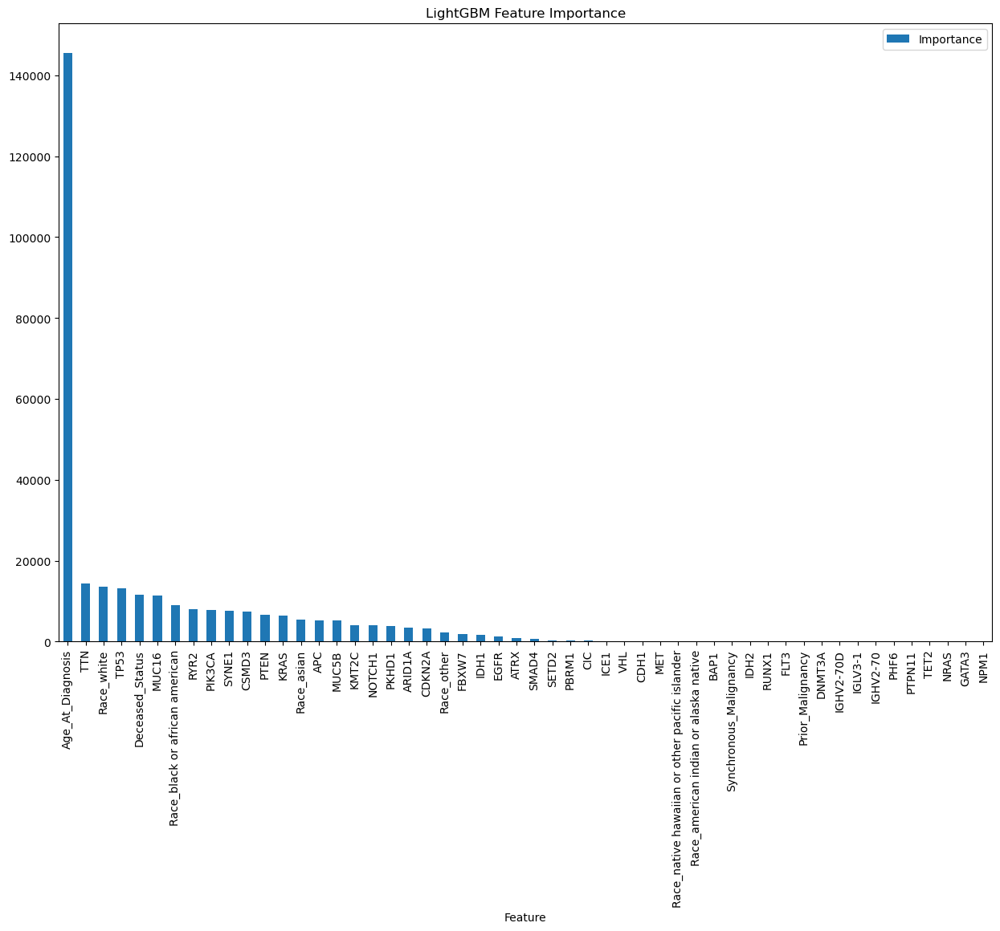

In [42]:
lgbm_feature_importance_df.plot(kind='bar', 
                                title='LightGBM Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))

## CatBoost Algorithm

In [25]:
cat_train = X_train.drop('Weight', axis=1)
cat_eval = X_test.drop('Weight', axis=1)
train_label = y_train
eval_label = y_test
cat_features=[0]

In [30]:
# Tuning hyperparameters using GridSearch

cat_model = CatBoostClassifier()

cat_grid_params = {'learning_rate': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],
                  'depth': [3,4,5],
                  'iterations': [10, 30, 50, 70, 100]}

cat_grid_search = cat_model.grid_search(cat_grid_params, X=X_train.drop('Weight', axis=1), y=y_train, cv=3, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.6358409	test: 1.6226505	best: 1.6226505 (0)	total: 2.79ms	remaining: 25.1ms
1:	learn: 1.4417011	test: 1.4326136	best: 1.4326136 (1)	total: 5.6ms	remaining: 22.4ms
2:	learn: 1.3359895	test: 1.3316229	best: 1.3316229 (2)	total: 8.43ms	remaining: 19.7ms
3:	learn: 1.2610615	test: 1.2606276	best: 1.2606276 (3)	total: 11.2ms	remaining: 16.8ms
4:	learn: 1.1844218	test: 1.1850293	best: 1.1850293 (4)	total: 14.1ms	remaining: 14.1ms
5:	learn: 1.1192312	test: 1.1226772	best: 1.1226772 (5)	total: 17ms	remaining: 11.4ms
6:	learn: 1.0742026	test: 1.0814427	best: 1.0814427 (6)	total: 20.2ms	remaining: 8.64ms
7:	learn: 1.0343431	test: 1.0419089	best: 1.0419089 (7)	total: 23.1ms	remaining: 5.77ms
8:	learn: 1.0073972	test: 1.0151222	best: 1.0151222 (8)	total: 25.7ms	remaining: 2.86ms
9:	learn: 0.9867423	test: 0.9943754	best: 0.9943754 (9)	total: 28.7ms	remaining: 0us

bestTest = 0.994375392
bestIteration = 9

0:	loss: 0.9943754	best: 0.9943754 (0)	total: 46.1ms	remaining: 4.79s
0:	learn: 1.4

6:	learn: 0.8508238	test: 0.8749911	best: 0.8749911 (6)	total: 18.2ms	remaining: 59.9ms
7:	learn: 0.8294765	test: 0.8553960	best: 0.8553960 (7)	total: 20.9ms	remaining: 57.4ms
8:	learn: 0.8041954	test: 0.8282213	best: 0.8282213 (8)	total: 23.5ms	remaining: 54.9ms
9:	learn: 0.7837168	test: 0.8029011	best: 0.8029011 (9)	total: 26.2ms	remaining: 52.4ms
10:	learn: 0.7744750	test: 0.7945495	best: 0.7945495 (10)	total: 28.8ms	remaining: 49.8ms
11:	learn: 0.7585723	test: 0.7780092	best: 0.7780092 (11)	total: 31.4ms	remaining: 47.1ms
12:	learn: 0.7470780	test: 0.7680493	best: 0.7680493 (12)	total: 34.1ms	remaining: 44.6ms
13:	learn: 0.7381204	test: 0.7575238	best: 0.7575238 (13)	total: 36.7ms	remaining: 41.9ms
14:	learn: 0.7275197	test: 0.7435939	best: 0.7435939 (14)	total: 39.4ms	remaining: 39.4ms
15:	learn: 0.7167186	test: 0.7352558	best: 0.7352558 (15)	total: 42.1ms	remaining: 36.9ms
16:	learn: 0.7065776	test: 0.7267295	best: 0.7267295 (16)	total: 44.8ms	remaining: 34.2ms
17:	learn: 0.69889

25:	learn: 0.5832866	test: 0.6385004	best: 0.6385004 (25)	total: 82.1ms	remaining: 12.6ms
26:	learn: 0.5819220	test: 0.6375883	best: 0.6375883 (26)	total: 85ms	remaining: 9.45ms
27:	learn: 0.5805807	test: 0.6371611	best: 0.6371611 (27)	total: 88.1ms	remaining: 6.29ms
28:	learn: 0.5791580	test: 0.6356875	best: 0.6356875 (28)	total: 91.1ms	remaining: 3.14ms
29:	learn: 0.5761639	test: 0.6352705	best: 0.6352705 (29)	total: 94ms	remaining: 0us

bestTest = 0.6352705344
bestIteration = 29

13:	loss: 0.6352705	best: 0.6352705 (13)	total: 847ms	remaining: 5.51s
0:	learn: 1.6358409	test: 1.6226505	best: 1.6226505 (0)	total: 2.57ms	remaining: 126ms
1:	learn: 1.4417011	test: 1.4326136	best: 1.4326136 (1)	total: 6.03ms	remaining: 145ms
2:	learn: 1.3359895	test: 1.3316229	best: 1.3316229 (2)	total: 8.96ms	remaining: 140ms
3:	learn: 1.2610615	test: 1.2606276	best: 1.2606276 (3)	total: 12.1ms	remaining: 139ms
4:	learn: 1.1844218	test: 1.1850293	best: 1.1850293 (4)	total: 14.8ms	remaining: 133ms
5:	lea

15:	learn: 0.7167186	test: 0.7352558	best: 0.7352558 (15)	total: 47.6ms	remaining: 101ms
16:	learn: 0.7065776	test: 0.7267295	best: 0.7267295 (16)	total: 50.4ms	remaining: 97.8ms
17:	learn: 0.6988908	test: 0.7191702	best: 0.7191702 (17)	total: 53.2ms	remaining: 94.6ms
18:	learn: 0.6885473	test: 0.7113682	best: 0.7113682 (18)	total: 56.1ms	remaining: 91.5ms
19:	learn: 0.6826783	test: 0.7063725	best: 0.7063725 (19)	total: 58.7ms	remaining: 88.1ms
20:	learn: 0.6750484	test: 0.7002157	best: 0.7002157 (20)	total: 61.4ms	remaining: 84.8ms
21:	learn: 0.6696815	test: 0.6942666	best: 0.6942666 (21)	total: 64.2ms	remaining: 81.7ms
22:	learn: 0.6659354	test: 0.6915451	best: 0.6915451 (22)	total: 66.7ms	remaining: 78.3ms
23:	learn: 0.6620677	test: 0.6873383	best: 0.6873383 (23)	total: 69.3ms	remaining: 75ms
24:	learn: 0.6581152	test: 0.6847266	best: 0.6847266 (24)	total: 71.9ms	remaining: 71.9ms
25:	learn: 0.6520517	test: 0.6795981	best: 0.6795981 (25)	total: 74.6ms	remaining: 68.9ms
26:	learn: 0.

23:	learn: 0.6076772	test: 0.6502631	best: 0.6502631 (23)	total: 144ms	remaining: 155ms
24:	learn: 0.6051350	test: 0.6489467	best: 0.6489467 (24)	total: 146ms	remaining: 146ms
25:	learn: 0.6013324	test: 0.6468345	best: 0.6468345 (25)	total: 149ms	remaining: 138ms
26:	learn: 0.5990291	test: 0.6458696	best: 0.6458696 (26)	total: 152ms	remaining: 129ms
27:	learn: 0.5974107	test: 0.6453845	best: 0.6453845 (27)	total: 155ms	remaining: 122ms
28:	learn: 0.5949575	test: 0.6421670	best: 0.6421670 (28)	total: 158ms	remaining: 114ms
29:	learn: 0.5922871	test: 0.6426549	best: 0.6421670 (28)	total: 161ms	remaining: 107ms
30:	learn: 0.5876326	test: 0.6358924	best: 0.6358924 (30)	total: 164ms	remaining: 100ms
31:	learn: 0.5848668	test: 0.6350838	best: 0.6350838 (31)	total: 167ms	remaining: 93.9ms
32:	learn: 0.5829196	test: 0.6336317	best: 0.6336317 (32)	total: 170ms	remaining: 87.8ms
33:	learn: 0.5817174	test: 0.6334519	best: 0.6334519 (33)	total: 174ms	remaining: 81.8ms
34:	learn: 0.5795648	test: 0.

49:	learn: 0.5388914	test: 0.6208131	best: 0.6204722 (48)	total: 148ms	remaining: 0us

bestTest = 0.6204722323
bestIteration = 48

20:	loss: 0.6204722	best: 0.6122575 (19)	total: 2.04s	remaining: 8.15s
0:	learn: 1.6358409	test: 1.6226505	best: 1.6226505 (0)	total: 4.58ms	remaining: 316ms
1:	learn: 1.4417011	test: 1.4326136	best: 1.4326136 (1)	total: 9.95ms	remaining: 338ms
2:	learn: 1.3359895	test: 1.3316229	best: 1.3316229 (2)	total: 14.8ms	remaining: 330ms
3:	learn: 1.2610615	test: 1.2606276	best: 1.2606276 (3)	total: 17.9ms	remaining: 296ms
4:	learn: 1.1844218	test: 1.1850293	best: 1.1850293 (4)	total: 21.9ms	remaining: 284ms
5:	learn: 1.1192312	test: 1.1226772	best: 1.1226772 (5)	total: 26ms	remaining: 277ms
6:	learn: 1.0742026	test: 1.0814427	best: 1.0814427 (6)	total: 29ms	remaining: 261ms
7:	learn: 1.0343431	test: 1.0419089	best: 1.0419089 (7)	total: 33.5ms	remaining: 259ms
8:	learn: 1.0073972	test: 1.0151222	best: 1.0151222 (8)	total: 37.2ms	remaining: 252ms
9:	learn: 0.9867423

49:	learn: 0.6242788	test: 0.6545943	best: 0.6545943 (49)	total: 144ms	remaining: 57.7ms
50:	learn: 0.6216215	test: 0.6523542	best: 0.6523542 (50)	total: 147ms	remaining: 54.7ms
51:	learn: 0.6196991	test: 0.6505683	best: 0.6505683 (51)	total: 150ms	remaining: 51.8ms
52:	learn: 0.6169269	test: 0.6489538	best: 0.6489538 (52)	total: 153ms	remaining: 49.1ms
53:	learn: 0.6133241	test: 0.6452704	best: 0.6452704 (53)	total: 156ms	remaining: 46.2ms
54:	learn: 0.6122976	test: 0.6446735	best: 0.6446735 (54)	total: 159ms	remaining: 43.3ms
55:	learn: 0.6111298	test: 0.6436171	best: 0.6436171 (55)	total: 162ms	remaining: 40.5ms
56:	learn: 0.6099589	test: 0.6430118	best: 0.6430118 (56)	total: 166ms	remaining: 37.9ms
57:	learn: 0.6090153	test: 0.6423021	best: 0.6423021 (57)	total: 170ms	remaining: 35.1ms
58:	learn: 0.6074583	test: 0.6415930	best: 0.6415930 (58)	total: 173ms	remaining: 32.2ms
59:	learn: 0.6047067	test: 0.6402694	best: 0.6402694 (59)	total: 176ms	remaining: 29.3ms
60:	learn: 0.6031687	

48:	learn: 0.5708314	test: 0.6216437	best: 0.6216437 (48)	total: 137ms	remaining: 58.9ms
49:	learn: 0.5698612	test: 0.6210572	best: 0.6210572 (49)	total: 140ms	remaining: 56.1ms
50:	learn: 0.5683726	test: 0.6193622	best: 0.6193622 (50)	total: 143ms	remaining: 53.2ms
51:	learn: 0.5666199	test: 0.6184632	best: 0.6184632 (51)	total: 145ms	remaining: 50.4ms
52:	learn: 0.5640210	test: 0.6183244	best: 0.6183244 (52)	total: 148ms	remaining: 47.5ms
53:	learn: 0.5630218	test: 0.6177855	best: 0.6177855 (53)	total: 151ms	remaining: 44.7ms
54:	learn: 0.5622814	test: 0.6174854	best: 0.6174854 (54)	total: 153ms	remaining: 41.8ms
55:	learn: 0.5611759	test: 0.6165422	best: 0.6165422 (55)	total: 156ms	remaining: 39ms
56:	learn: 0.5602067	test: 0.6164132	best: 0.6164132 (56)	total: 159ms	remaining: 36.2ms
57:	learn: 0.5591229	test: 0.6164121	best: 0.6164121 (57)	total: 162ms	remaining: 33.5ms
58:	learn: 0.5583725	test: 0.6161740	best: 0.6161740 (58)	total: 165ms	remaining: 30.8ms
59:	learn: 0.5566515	te

49:	learn: 0.5450821	test: 0.6132450	best: 0.6122575 (48)	total: 146ms	remaining: 58.5ms
50:	learn: 0.5436863	test: 0.6120384	best: 0.6120384 (50)	total: 149ms	remaining: 55.6ms
51:	learn: 0.5421089	test: 0.6114447	best: 0.6114447 (51)	total: 152ms	remaining: 52.5ms
52:	learn: 0.5413893	test: 0.6105612	best: 0.6105612 (52)	total: 155ms	remaining: 49.6ms
53:	learn: 0.5402031	test: 0.6109862	best: 0.6105612 (52)	total: 158ms	remaining: 46.7ms
54:	learn: 0.5389764	test: 0.6114741	best: 0.6105612 (52)	total: 161ms	remaining: 43.8ms
55:	learn: 0.5380140	test: 0.6121803	best: 0.6105612 (52)	total: 163ms	remaining: 40.8ms
56:	learn: 0.5365704	test: 0.6118623	best: 0.6105612 (52)	total: 166ms	remaining: 37.9ms
57:	learn: 0.5357255	test: 0.6119044	best: 0.6105612 (52)	total: 169ms	remaining: 34.9ms
58:	learn: 0.5341716	test: 0.6127702	best: 0.6105612 (52)	total: 171ms	remaining: 32ms
59:	learn: 0.5335616	test: 0.6122737	best: 0.6105612 (52)	total: 174ms	remaining: 29ms
60:	learn: 0.5325871	test

50:	learn: 0.6756116	test: 0.6972131	best: 0.6972131 (50)	total: 142ms	remaining: 137ms
51:	learn: 0.6733210	test: 0.6950730	best: 0.6950730 (51)	total: 145ms	remaining: 134ms
52:	learn: 0.6702881	test: 0.6924150	best: 0.6924150 (52)	total: 148ms	remaining: 131ms
53:	learn: 0.6685629	test: 0.6910172	best: 0.6910172 (53)	total: 151ms	remaining: 128ms
54:	learn: 0.6640873	test: 0.6862953	best: 0.6862953 (54)	total: 154ms	remaining: 126ms
55:	learn: 0.6609049	test: 0.6835585	best: 0.6835585 (55)	total: 156ms	remaining: 123ms
56:	learn: 0.6594825	test: 0.6826779	best: 0.6826779 (56)	total: 159ms	remaining: 120ms
57:	learn: 0.6574193	test: 0.6818687	best: 0.6818687 (57)	total: 162ms	remaining: 117ms
58:	learn: 0.6554056	test: 0.6797089	best: 0.6797089 (58)	total: 164ms	remaining: 114ms
59:	learn: 0.6523765	test: 0.6766495	best: 0.6766495 (59)	total: 167ms	remaining: 111ms
60:	learn: 0.6493630	test: 0.6739038	best: 0.6739038 (60)	total: 170ms	remaining: 109ms
61:	learn: 0.6472958	test: 0.671

1:	learn: 1.1309772	test: 1.1266737	best: 1.1266737 (1)	total: 6.03ms	remaining: 295ms
2:	learn: 1.0453700	test: 1.0501280	best: 1.0501280 (2)	total: 9.41ms	remaining: 304ms
3:	learn: 0.9730549	test: 0.9853944	best: 0.9853944 (3)	total: 12ms	remaining: 289ms
4:	learn: 0.8989454	test: 0.9180695	best: 0.9180695 (4)	total: 14.7ms	remaining: 279ms
5:	learn: 0.8686742	test: 0.8914560	best: 0.8914560 (5)	total: 17.4ms	remaining: 272ms
6:	learn: 0.8508238	test: 0.8749911	best: 0.8749911 (6)	total: 19.9ms	remaining: 264ms
7:	learn: 0.8294765	test: 0.8553960	best: 0.8553960 (7)	total: 22.4ms	remaining: 258ms
8:	learn: 0.8041954	test: 0.8282213	best: 0.8282213 (8)	total: 25.1ms	remaining: 254ms
9:	learn: 0.7837168	test: 0.8029011	best: 0.8029011 (9)	total: 27.7ms	remaining: 249ms
10:	learn: 0.7744750	test: 0.7945495	best: 0.7945495 (10)	total: 30.3ms	remaining: 245ms
11:	learn: 0.7585723	test: 0.7780092	best: 0.7780092 (11)	total: 33.4ms	remaining: 245ms
12:	learn: 0.7470780	test: 0.7680493	best

38:	learn: 0.5869039	test: 0.6299891	best: 0.6299891 (38)	total: 122ms	remaining: 191ms
39:	learn: 0.5831621	test: 0.6287874	best: 0.6287874 (39)	total: 125ms	remaining: 188ms
40:	learn: 0.5817060	test: 0.6291421	best: 0.6287874 (39)	total: 128ms	remaining: 184ms
41:	learn: 0.5797426	test: 0.6272861	best: 0.6272861 (41)	total: 131ms	remaining: 180ms
42:	learn: 0.5786830	test: 0.6260215	best: 0.6260215 (42)	total: 134ms	remaining: 177ms
43:	learn: 0.5772518	test: 0.6247588	best: 0.6247588 (43)	total: 137ms	remaining: 174ms
44:	learn: 0.5762653	test: 0.6249188	best: 0.6247588 (43)	total: 140ms	remaining: 171ms
45:	learn: 0.5749156	test: 0.6239913	best: 0.6239913 (45)	total: 142ms	remaining: 167ms
46:	learn: 0.5728298	test: 0.6226518	best: 0.6226518 (46)	total: 146ms	remaining: 164ms
47:	learn: 0.5721726	test: 0.6225816	best: 0.6225816 (47)	total: 148ms	remaining: 160ms
48:	learn: 0.5708314	test: 0.6216437	best: 0.6216437 (48)	total: 151ms	remaining: 157ms
49:	learn: 0.5698612	test: 0.621

78:	learn: 0.5283570	test: 0.6128169	best: 0.6123999 (74)	total: 226ms	remaining: 60ms
79:	learn: 0.5278631	test: 0.6131565	best: 0.6123999 (74)	total: 228ms	remaining: 57.1ms
80:	learn: 0.5272377	test: 0.6124372	best: 0.6123999 (74)	total: 231ms	remaining: 54.2ms
81:	learn: 0.5264361	test: 0.6121655	best: 0.6121655 (81)	total: 234ms	remaining: 51.4ms
82:	learn: 0.5259024	test: 0.6115957	best: 0.6115957 (82)	total: 237ms	remaining: 48.5ms
83:	learn: 0.5255588	test: 0.6115198	best: 0.6115198 (83)	total: 240ms	remaining: 45.6ms
84:	learn: 0.5251318	test: 0.6111773	best: 0.6111773 (84)	total: 242ms	remaining: 42.7ms
85:	learn: 0.5247901	test: 0.6108176	best: 0.6108176 (85)	total: 245ms	remaining: 39.8ms
86:	learn: 0.5244614	test: 0.6105481	best: 0.6105481 (86)	total: 247ms	remaining: 37ms
87:	learn: 0.5240025	test: 0.6106981	best: 0.6105481 (86)	total: 250ms	remaining: 34.1ms
88:	learn: 0.5235568	test: 0.6104989	best: 0.6104989 (88)	total: 253ms	remaining: 31.2ms
89:	learn: 0.5231946	test

24:	learn: 0.5883546	test: 0.6436484	best: 0.6436484 (24)	total: 74.7ms	remaining: 224ms
25:	learn: 0.5832866	test: 0.6385004	best: 0.6385004 (25)	total: 77.5ms	remaining: 220ms
26:	learn: 0.5819220	test: 0.6375883	best: 0.6375883 (26)	total: 80.1ms	remaining: 217ms
27:	learn: 0.5805807	test: 0.6371611	best: 0.6371611 (27)	total: 82.8ms	remaining: 213ms
28:	learn: 0.5791580	test: 0.6356875	best: 0.6356875 (28)	total: 85.6ms	remaining: 209ms
29:	learn: 0.5761639	test: 0.6352705	best: 0.6352705 (29)	total: 88.5ms	remaining: 206ms
30:	learn: 0.5753057	test: 0.6360052	best: 0.6352705 (29)	total: 91.2ms	remaining: 203ms
31:	learn: 0.5733258	test: 0.6353540	best: 0.6352705 (29)	total: 94ms	remaining: 200ms
32:	learn: 0.5698510	test: 0.6318591	best: 0.6318591 (32)	total: 96.6ms	remaining: 196ms
33:	learn: 0.5681513	test: 0.6316963	best: 0.6316963 (33)	total: 99.2ms	remaining: 192ms
34:	learn: 0.5661948	test: 0.6308947	best: 0.6308947 (34)	total: 102ms	remaining: 189ms
35:	learn: 0.5639883	tes

9:	learn: 0.6807719	test: 0.7101920	best: 0.7101920 (9)	total: 36ms	remaining: 0us

bestTest = 0.7101920393
bestIteration = 9

39:	loss: 0.7101920	best: 0.5951582 (30)	total: 5.78s	remaining: 9.39s
0:	learn: 1.1686305	test: 1.1749101	best: 1.1749101 (0)	total: 3.46ms	remaining: 31.1ms
1:	learn: 0.9457731	test: 0.9655364	best: 0.9655364 (1)	total: 7.37ms	remaining: 29.5ms
2:	learn: 0.8404852	test: 0.8701376	best: 0.8701376 (2)	total: 11.2ms	remaining: 26.1ms
3:	learn: 0.8018327	test: 0.8272396	best: 0.8272396 (3)	total: 14.8ms	remaining: 22.2ms
4:	learn: 0.7733395	test: 0.8042408	best: 0.8042408 (4)	total: 18.3ms	remaining: 18.3ms
5:	learn: 0.7432405	test: 0.7759419	best: 0.7759419 (5)	total: 21.9ms	remaining: 14.6ms
6:	learn: 0.7143310	test: 0.7486693	best: 0.7486693 (6)	total: 25.3ms	remaining: 10.8ms
7:	learn: 0.6922742	test: 0.7296215	best: 0.7296215 (7)	total: 29.3ms	remaining: 7.32ms
8:	learn: 0.6775259	test: 0.7222362	best: 0.7222362 (8)	total: 34ms	remaining: 3.78ms
9:	learn: 0.

1:	learn: 0.9916916	test: 0.9976126	best: 0.9976126 (1)	total: 7.77ms	remaining: 109ms
2:	learn: 0.9126427	test: 0.9203178	best: 0.9203178 (2)	total: 11.3ms	remaining: 102ms
3:	learn: 0.8415891	test: 0.8485959	best: 0.8485959 (3)	total: 14.9ms	remaining: 97.1ms
4:	learn: 0.7945572	test: 0.8091685	best: 0.8091685 (4)	total: 18.9ms	remaining: 94.6ms
5:	learn: 0.7699059	test: 0.7870374	best: 0.7870374 (5)	total: 22.6ms	remaining: 90.5ms
6:	learn: 0.7558980	test: 0.7736050	best: 0.7736050 (6)	total: 26.2ms	remaining: 86.1ms
7:	learn: 0.7367358	test: 0.7569710	best: 0.7569710 (7)	total: 29.7ms	remaining: 81.7ms
8:	learn: 0.7189560	test: 0.7405770	best: 0.7405770 (8)	total: 33.2ms	remaining: 77.5ms
9:	learn: 0.7068956	test: 0.7309580	best: 0.7309580 (9)	total: 36.7ms	remaining: 73.3ms
10:	learn: 0.6999894	test: 0.7253853	best: 0.7253853 (10)	total: 40.1ms	remaining: 69.3ms
11:	learn: 0.6904158	test: 0.7169078	best: 0.7169078 (11)	total: 43.7ms	remaining: 65.6ms
12:	learn: 0.6792921	test: 0.7

17:	learn: 0.5892294	test: 0.6392983	best: 0.6392983 (17)	total: 66.8ms	remaining: 44.6ms
18:	learn: 0.5845382	test: 0.6382501	best: 0.6382501 (18)	total: 70.5ms	remaining: 40.8ms
19:	learn: 0.5823848	test: 0.6381057	best: 0.6381057 (19)	total: 74.1ms	remaining: 37.1ms
20:	learn: 0.5807341	test: 0.6365412	best: 0.6365412 (20)	total: 77.6ms	remaining: 33.3ms
21:	learn: 0.5770492	test: 0.6340863	best: 0.6340863 (21)	total: 81ms	remaining: 29.5ms
22:	learn: 0.5705943	test: 0.6295519	best: 0.6295519 (22)	total: 84.9ms	remaining: 25.8ms
23:	learn: 0.5682794	test: 0.6278962	best: 0.6278962 (23)	total: 89ms	remaining: 22.2ms
24:	learn: 0.5660074	test: 0.6276167	best: 0.6276167 (24)	total: 93.1ms	remaining: 18.6ms
25:	learn: 0.5624643	test: 0.6274471	best: 0.6274471 (25)	total: 96.8ms	remaining: 14.9ms
26:	learn: 0.5589998	test: 0.6234260	best: 0.6234260 (26)	total: 101ms	remaining: 11.2ms
27:	learn: 0.5567283	test: 0.6212825	best: 0.6212825 (27)	total: 105ms	remaining: 7.47ms
28:	learn: 0.553

47:	learn: 0.5911933	test: 0.6296947	best: 0.6296947 (47)	total: 177ms	remaining: 7.39ms
48:	learn: 0.5892471	test: 0.6270433	best: 0.6270433 (48)	total: 181ms	remaining: 3.7ms
49:	learn: 0.5879217	test: 0.6260596	best: 0.6260596 (49)	total: 185ms	remaining: 0us

bestTest = 0.6260595796
bestIteration = 49

50:	loss: 0.6260596	best: 0.5951582 (30)	total: 7.04s	remaining: 7.46s
0:	learn: 1.2753805	test: 1.2647972	best: 1.2647972 (0)	total: 3.31ms	remaining: 162ms
1:	learn: 1.0866031	test: 1.0915077	best: 1.0915077 (1)	total: 6.99ms	remaining: 168ms
2:	learn: 0.9867154	test: 0.9962851	best: 0.9962851 (2)	total: 10.6ms	remaining: 167ms
3:	learn: 0.8979274	test: 0.9200925	best: 0.9200925 (3)	total: 14.1ms	remaining: 162ms
4:	learn: 0.8618456	test: 0.8859174	best: 0.8859174 (4)	total: 18.2ms	remaining: 164ms
5:	learn: 0.8333551	test: 0.8592464	best: 0.8592464 (5)	total: 21.8ms	remaining: 160ms
6:	learn: 0.8132107	test: 0.8359704	best: 0.8359704 (6)	total: 25ms	remaining: 154ms
7:	learn: 0.78

44:	learn: 0.5488541	test: 0.6023299	best: 0.6023299 (44)	total: 200ms	remaining: 22.2ms
45:	learn: 0.5474338	test: 0.6026792	best: 0.6023299 (44)	total: 204ms	remaining: 17.7ms
46:	learn: 0.5450511	test: 0.5998564	best: 0.5998564 (46)	total: 208ms	remaining: 13.3ms
47:	learn: 0.5440680	test: 0.5988177	best: 0.5988177 (47)	total: 212ms	remaining: 8.84ms
48:	learn: 0.5430420	test: 0.5993687	best: 0.5988177 (47)	total: 217ms	remaining: 4.42ms
49:	learn: 0.5420039	test: 0.5987743	best: 0.5987743 (49)	total: 222ms	remaining: 0us

bestTest = 0.5987743333
bestIteration = 49

52:	loss: 0.5987743	best: 0.5951582 (30)	total: 7.47s	remaining: 7.33s
0:	learn: 1.1795528	test: 1.1788794	best: 1.1788794 (0)	total: 4.33ms	remaining: 212ms
1:	learn: 0.9574867	test: 0.9701457	best: 0.9701457 (1)	total: 9.13ms	remaining: 219ms
2:	learn: 0.8524710	test: 0.8748611	best: 0.8748611 (2)	total: 13.7ms	remaining: 214ms
3:	learn: 0.8103553	test: 0.8266981	best: 0.8266981 (3)	total: 18ms	remaining: 207ms
4:	lear

24:	learn: 0.5660074	test: 0.6276167	best: 0.6276167 (24)	total: 110ms	remaining: 110ms
25:	learn: 0.5624643	test: 0.6274471	best: 0.6274471 (25)	total: 114ms	remaining: 105ms
26:	learn: 0.5589998	test: 0.6234260	best: 0.6234260 (26)	total: 117ms	remaining: 100ms
27:	learn: 0.5567283	test: 0.6212825	best: 0.6212825 (27)	total: 122ms	remaining: 96ms
28:	learn: 0.5533473	test: 0.6175499	best: 0.6175499 (28)	total: 126ms	remaining: 91.4ms
29:	learn: 0.5510460	test: 0.6176649	best: 0.6175499 (28)	total: 130ms	remaining: 86.5ms
30:	learn: 0.5479773	test: 0.6171330	best: 0.6171330 (30)	total: 133ms	remaining: 81.6ms
31:	learn: 0.5464388	test: 0.6158539	best: 0.6158539 (31)	total: 137ms	remaining: 76.9ms
32:	learn: 0.5419850	test: 0.6142145	best: 0.6142145 (32)	total: 140ms	remaining: 72.3ms
33:	learn: 0.5404278	test: 0.6133708	best: 0.6133708 (33)	total: 144ms	remaining: 68ms
34:	learn: 0.5377685	test: 0.6115521	best: 0.6115521 (34)	total: 149ms	remaining: 63.9ms
35:	learn: 0.5368263	test: 0

37:	learn: 0.6174452	test: 0.6495825	best: 0.6495825 (37)	total: 176ms	remaining: 148ms
38:	learn: 0.6148461	test: 0.6476038	best: 0.6476038 (38)	total: 180ms	remaining: 143ms
39:	learn: 0.6114205	test: 0.6450397	best: 0.6450397 (39)	total: 184ms	remaining: 138ms
40:	learn: 0.6091941	test: 0.6429859	best: 0.6429859 (40)	total: 189ms	remaining: 134ms
41:	learn: 0.6063808	test: 0.6412076	best: 0.6412076 (41)	total: 194ms	remaining: 129ms
42:	learn: 0.6050120	test: 0.6399026	best: 0.6399026 (42)	total: 199ms	remaining: 125ms
43:	learn: 0.6028146	test: 0.6382283	best: 0.6382283 (43)	total: 203ms	remaining: 120ms
44:	learn: 0.5984627	test: 0.6343934	best: 0.6343934 (44)	total: 207ms	remaining: 115ms
45:	learn: 0.5965683	test: 0.6331494	best: 0.6331494 (45)	total: 211ms	remaining: 110ms
46:	learn: 0.5933785	test: 0.6306237	best: 0.6306237 (46)	total: 216ms	remaining: 105ms
47:	learn: 0.5911933	test: 0.6296947	best: 0.6296947 (47)	total: 219ms	remaining: 101ms
48:	learn: 0.5892471	test: 0.627

23:	learn: 0.6024866	test: 0.6404145	best: 0.6404145 (23)	total: 125ms	remaining: 239ms
24:	learn: 0.6001016	test: 0.6388559	best: 0.6388559 (24)	total: 128ms	remaining: 231ms
25:	learn: 0.5947019	test: 0.6328272	best: 0.6328272 (25)	total: 132ms	remaining: 223ms
26:	learn: 0.5912905	test: 0.6297316	best: 0.6297316 (26)	total: 137ms	remaining: 217ms
27:	learn: 0.5869975	test: 0.6265322	best: 0.6265322 (27)	total: 142ms	remaining: 213ms
28:	learn: 0.5827821	test: 0.6215383	best: 0.6215383 (28)	total: 146ms	remaining: 207ms
29:	learn: 0.5807108	test: 0.6213159	best: 0.6213159 (29)	total: 151ms	remaining: 202ms
30:	learn: 0.5780047	test: 0.6181207	best: 0.6181207 (30)	total: 155ms	remaining: 195ms
31:	learn: 0.5746606	test: 0.6157879	best: 0.6157879 (31)	total: 160ms	remaining: 189ms
32:	learn: 0.5725473	test: 0.6140030	best: 0.6140030 (32)	total: 163ms	remaining: 183ms
33:	learn: 0.5703297	test: 0.6127710	best: 0.6127710 (33)	total: 167ms	remaining: 177ms
34:	learn: 0.5679239	test: 0.612

52:	learn: 0.5304184	test: 0.6056856	best: 0.6056856 (52)	total: 228ms	remaining: 73.2ms
53:	learn: 0.5285600	test: 0.6064298	best: 0.6056856 (52)	total: 233ms	remaining: 68.9ms
54:	learn: 0.5276962	test: 0.6063594	best: 0.6056856 (52)	total: 238ms	remaining: 64.9ms
55:	learn: 0.5262580	test: 0.6061605	best: 0.6056856 (52)	total: 243ms	remaining: 60.8ms
56:	learn: 0.5250277	test: 0.6058189	best: 0.6056856 (52)	total: 247ms	remaining: 56.3ms
57:	learn: 0.5239228	test: 0.6058510	best: 0.6056856 (52)	total: 252ms	remaining: 52.1ms
58:	learn: 0.5229028	test: 0.6059341	best: 0.6056856 (52)	total: 257ms	remaining: 47.9ms
59:	learn: 0.5216967	test: 0.6057071	best: 0.6056856 (52)	total: 262ms	remaining: 43.6ms
60:	learn: 0.5205049	test: 0.6049627	best: 0.6049627 (60)	total: 266ms	remaining: 39.3ms
61:	learn: 0.5189262	test: 0.6058036	best: 0.6049627 (60)	total: 271ms	remaining: 34.9ms
62:	learn: 0.5177914	test: 0.6045835	best: 0.6045835 (62)	total: 276ms	remaining: 30.7ms
63:	learn: 0.5167989	

38:	learn: 0.5322452	test: 0.6125116	best: 0.6109937 (35)	total: 213ms	remaining: 169ms
39:	learn: 0.5311133	test: 0.6124736	best: 0.6109937 (35)	total: 217ms	remaining: 163ms
40:	learn: 0.5295734	test: 0.6118951	best: 0.6109937 (35)	total: 223ms	remaining: 157ms
41:	learn: 0.5285211	test: 0.6117969	best: 0.6109937 (35)	total: 228ms	remaining: 152ms
42:	learn: 0.5262985	test: 0.6109690	best: 0.6109690 (42)	total: 233ms	remaining: 146ms
43:	learn: 0.5248920	test: 0.6103789	best: 0.6103789 (43)	total: 238ms	remaining: 141ms
44:	learn: 0.5235747	test: 0.6100955	best: 0.6100955 (44)	total: 243ms	remaining: 135ms
45:	learn: 0.5226644	test: 0.6104683	best: 0.6100955 (44)	total: 248ms	remaining: 130ms
46:	learn: 0.5215177	test: 0.6102385	best: 0.6100955 (44)	total: 254ms	remaining: 124ms
47:	learn: 0.5193498	test: 0.6118382	best: 0.6100955 (44)	total: 259ms	remaining: 119ms
48:	learn: 0.5180598	test: 0.6112162	best: 0.6100955 (44)	total: 265ms	remaining: 114ms
49:	learn: 0.5171834	test: 0.611

8:	learn: 0.8452044	test: 0.8596889	best: 0.8596889 (8)	total: 33.5ms	remaining: 339ms
9:	learn: 0.8200789	test: 0.8368412	best: 0.8368412 (9)	total: 37.2ms	remaining: 335ms
10:	learn: 0.8025529	test: 0.8210527	best: 0.8210527 (10)	total: 40.6ms	remaining: 328ms
11:	learn: 0.7821930	test: 0.7979120	best: 0.7979120 (11)	total: 44.3ms	remaining: 325ms
12:	learn: 0.7709138	test: 0.7861218	best: 0.7861218 (12)	total: 48ms	remaining: 321ms
13:	learn: 0.7611006	test: 0.7749869	best: 0.7749869 (13)	total: 51.5ms	remaining: 316ms
14:	learn: 0.7473573	test: 0.7642017	best: 0.7642017 (14)	total: 54.9ms	remaining: 311ms
15:	learn: 0.7307145	test: 0.7498299	best: 0.7498299 (15)	total: 58.9ms	remaining: 309ms
16:	learn: 0.7221932	test: 0.7414817	best: 0.7414817 (16)	total: 62.3ms	remaining: 304ms
17:	learn: 0.7124091	test: 0.7306256	best: 0.7306256 (17)	total: 66.1ms	remaining: 301ms
18:	learn: 0.7050321	test: 0.7242113	best: 0.7242113 (18)	total: 70.6ms	remaining: 301ms
19:	learn: 0.6980702	test: 

14:	learn: 0.6939990	test: 0.7226719	best: 0.7226719 (14)	total: 55.7ms	remaining: 316ms
15:	learn: 0.6893457	test: 0.7172384	best: 0.7172384 (15)	total: 59.2ms	remaining: 311ms
16:	learn: 0.6788377	test: 0.7073014	best: 0.7073014 (16)	total: 62.6ms	remaining: 306ms
17:	learn: 0.6701859	test: 0.6963843	best: 0.6963843 (17)	total: 66.5ms	remaining: 303ms
18:	learn: 0.6621950	test: 0.6880491	best: 0.6880491 (18)	total: 70.5ms	remaining: 300ms
19:	learn: 0.6560312	test: 0.6837168	best: 0.6837168 (19)	total: 74ms	remaining: 296ms
20:	learn: 0.6461100	test: 0.6729878	best: 0.6729878 (20)	total: 77.5ms	remaining: 292ms
21:	learn: 0.6417939	test: 0.6701613	best: 0.6701613 (21)	total: 81ms	remaining: 287ms
22:	learn: 0.6375714	test: 0.6668041	best: 0.6668041 (22)	total: 84.4ms	remaining: 283ms
23:	learn: 0.6333304	test: 0.6628829	best: 0.6628829 (23)	total: 87.9ms	remaining: 278ms
24:	learn: 0.6305250	test: 0.6613018	best: 0.6613018 (24)	total: 91.6ms	remaining: 275ms
25:	learn: 0.6225006	test

10:	learn: 0.6999894	test: 0.7253853	best: 0.7253853 (10)	total: 43.7ms	remaining: 354ms
11:	learn: 0.6904158	test: 0.7169078	best: 0.7169078 (11)	total: 47.2ms	remaining: 346ms
12:	learn: 0.6792921	test: 0.7089853	best: 0.7089853 (12)	total: 51ms	remaining: 341ms
13:	learn: 0.6737586	test: 0.7047841	best: 0.7047841 (13)	total: 54.9ms	remaining: 337ms
14:	learn: 0.6655238	test: 0.7002794	best: 0.7002794 (14)	total: 58.4ms	remaining: 331ms
15:	learn: 0.6473185	test: 0.6828402	best: 0.6828402 (15)	total: 62ms	remaining: 325ms
16:	learn: 0.6404616	test: 0.6757983	best: 0.6757983 (16)	total: 65.4ms	remaining: 319ms
17:	learn: 0.6323864	test: 0.6665707	best: 0.6665707 (17)	total: 68.9ms	remaining: 314ms
18:	learn: 0.6259699	test: 0.6602904	best: 0.6602904 (18)	total: 72.5ms	remaining: 309ms
19:	learn: 0.6209841	test: 0.6569197	best: 0.6569197 (19)	total: 76ms	remaining: 304ms
20:	learn: 0.6160519	test: 0.6507513	best: 0.6507513 (20)	total: 79.5ms	remaining: 299ms
21:	learn: 0.6100110	test: 

10:	learn: 0.6712968	test: 0.7043036	best: 0.7043036 (10)	total: 43.8ms	remaining: 355ms
11:	learn: 0.6566157	test: 0.6923777	best: 0.6923777 (11)	total: 47.7ms	remaining: 350ms
12:	learn: 0.6490817	test: 0.6872540	best: 0.6872540 (12)	total: 51.5ms	remaining: 345ms
13:	learn: 0.6441629	test: 0.6815365	best: 0.6815365 (13)	total: 55.7ms	remaining: 342ms
14:	learn: 0.6402458	test: 0.6786474	best: 0.6786474 (14)	total: 59.6ms	remaining: 338ms
15:	learn: 0.6348313	test: 0.6714929	best: 0.6714929 (15)	total: 63.4ms	remaining: 333ms
16:	learn: 0.6213177	test: 0.6587609	best: 0.6587609 (16)	total: 67.1ms	remaining: 327ms
17:	learn: 0.6147081	test: 0.6541328	best: 0.6541328 (17)	total: 70.9ms	remaining: 323ms
18:	learn: 0.6112396	test: 0.6508221	best: 0.6508221 (18)	total: 74.4ms	remaining: 317ms
19:	learn: 0.6080344	test: 0.6506307	best: 0.6506307 (19)	total: 77.9ms	remaining: 312ms
20:	learn: 0.6006565	test: 0.6419553	best: 0.6419553 (20)	total: 81.6ms	remaining: 307ms
21:	learn: 0.5964843	

7:	learn: 0.6922742	test: 0.7296215	best: 0.7296215 (7)	total: 37.1ms	remaining: 427ms
8:	learn: 0.6775259	test: 0.7222362	best: 0.7222362 (8)	total: 41.3ms	remaining: 418ms
9:	learn: 0.6621800	test: 0.7069050	best: 0.7069050 (9)	total: 45.2ms	remaining: 407ms
10:	learn: 0.6532260	test: 0.6962539	best: 0.6962539 (10)	total: 49.7ms	remaining: 402ms
11:	learn: 0.6451187	test: 0.6880460	best: 0.6880460 (11)	total: 54.3ms	remaining: 398ms
12:	learn: 0.6402129	test: 0.6821442	best: 0.6821442 (12)	total: 59.2ms	remaining: 396ms
13:	learn: 0.6327797	test: 0.6753790	best: 0.6753790 (13)	total: 63.5ms	remaining: 390ms
14:	learn: 0.6285548	test: 0.6734218	best: 0.6734218 (14)	total: 67.5ms	remaining: 382ms
15:	learn: 0.6225465	test: 0.6706220	best: 0.6706220 (15)	total: 71.7ms	remaining: 376ms
16:	learn: 0.6187785	test: 0.6673906	best: 0.6673906 (16)	total: 75.7ms	remaining: 370ms
17:	learn: 0.6107054	test: 0.6634623	best: 0.6634623 (17)	total: 79.5ms	remaining: 362ms
18:	learn: 0.5994081	test: 

11:	learn: 0.6315657	test: 0.6787492	best: 0.6787492 (11)	total: 43.3ms	remaining: 317ms
12:	learn: 0.6218617	test: 0.6647707	best: 0.6647707 (12)	total: 46.9ms	remaining: 314ms
13:	learn: 0.6173406	test: 0.6630247	best: 0.6630247 (13)	total: 50.6ms	remaining: 311ms
14:	learn: 0.6093755	test: 0.6594282	best: 0.6594282 (14)	total: 55ms	remaining: 312ms
15:	learn: 0.5994332	test: 0.6498767	best: 0.6498767 (15)	total: 58.8ms	remaining: 309ms
16:	learn: 0.5943320	test: 0.6464741	best: 0.6464741 (16)	total: 62.4ms	remaining: 305ms
17:	learn: 0.5892294	test: 0.6392983	best: 0.6392983 (17)	total: 66.1ms	remaining: 301ms
18:	learn: 0.5845382	test: 0.6382501	best: 0.6382501 (18)	total: 69.8ms	remaining: 298ms
19:	learn: 0.5823848	test: 0.6381057	best: 0.6381057 (19)	total: 73.4ms	remaining: 294ms
20:	learn: 0.5807341	test: 0.6365412	best: 0.6365412 (20)	total: 77.3ms	remaining: 291ms
21:	learn: 0.5770492	test: 0.6340863	best: 0.6340863 (21)	total: 81.4ms	remaining: 288ms
22:	learn: 0.5705943	te

6:	learn: 0.9974776	test: 1.0028316	best: 1.0028316 (6)	total: 43.9ms	remaining: 18.8ms
7:	learn: 0.9508955	test: 0.9574859	best: 0.9574859 (7)	total: 48.7ms	remaining: 12.2ms
8:	learn: 0.9202301	test: 0.9287762	best: 0.9287762 (8)	total: 54.7ms	remaining: 6.07ms
9:	learn: 0.8869152	test: 0.8950775	best: 0.8950775 (9)	total: 59.8ms	remaining: 0us

bestTest = 0.8950774805
bestIteration = 9

70:	loss: 0.8950775	best: 0.5875267 (66)	total: 13.4s	remaining: 6.44s
0:	learn: 1.3606421	test: 1.3478389	best: 1.3478389 (0)	total: 4.53ms	remaining: 40.7ms
1:	learn: 1.1616124	test: 1.1583770	best: 1.1583770 (1)	total: 9.72ms	remaining: 38.9ms
2:	learn: 1.0456022	test: 1.0532309	best: 1.0532309 (2)	total: 14.5ms	remaining: 33.8ms
3:	learn: 0.9744270	test: 0.9823823	best: 0.9823823 (3)	total: 20.1ms	remaining: 30.1ms
4:	learn: 0.9271458	test: 0.9356240	best: 0.9356240 (4)	total: 25.3ms	remaining: 25.3ms
5:	learn: 0.8937505	test: 0.9060258	best: 0.9060258 (5)	total: 30.5ms	remaining: 20.3ms
6:	learn

10:	learn: 0.7655461	test: 0.7821261	best: 0.7821261 (10)	total: 57.8ms	remaining: 99.9ms
11:	learn: 0.7532686	test: 0.7716310	best: 0.7716310 (11)	total: 63.7ms	remaining: 95.5ms
12:	learn: 0.7408905	test: 0.7579374	best: 0.7579374 (12)	total: 69.8ms	remaining: 91.3ms
13:	learn: 0.7290421	test: 0.7470535	best: 0.7470535 (13)	total: 76.1ms	remaining: 87ms
14:	learn: 0.7173344	test: 0.7360674	best: 0.7360674 (14)	total: 81.8ms	remaining: 81.8ms
15:	learn: 0.7082780	test: 0.7285758	best: 0.7285758 (15)	total: 86.9ms	remaining: 76ms
16:	learn: 0.6995981	test: 0.7193308	best: 0.7193308 (16)	total: 92.2ms	remaining: 70.5ms
17:	learn: 0.6926970	test: 0.7133727	best: 0.7133727 (17)	total: 97.6ms	remaining: 65.1ms
18:	learn: 0.6829472	test: 0.7048492	best: 0.7048492 (18)	total: 103ms	remaining: 59.5ms
19:	learn: 0.6776564	test: 0.6994759	best: 0.6994759 (19)	total: 109ms	remaining: 54.4ms
20:	learn: 0.6726621	test: 0.6951639	best: 0.6951639 (20)	total: 115ms	remaining: 49.1ms
21:	learn: 0.6637

24:	learn: 0.5582930	test: 0.6210124	best: 0.6210124 (24)	total: 165ms	remaining: 32.9ms
25:	learn: 0.5555704	test: 0.6191670	best: 0.6191670 (25)	total: 173ms	remaining: 26.6ms
26:	learn: 0.5524909	test: 0.6185982	best: 0.6185982 (26)	total: 178ms	remaining: 19.8ms
27:	learn: 0.5498864	test: 0.6177323	best: 0.6177323 (27)	total: 186ms	remaining: 13.3ms
28:	learn: 0.5470368	test: 0.6165118	best: 0.6165118 (28)	total: 193ms	remaining: 6.66ms
29:	learn: 0.5440390	test: 0.6144360	best: 0.6144360 (29)	total: 199ms	remaining: 0us

bestTest = 0.6144360398
bestIteration = 29

81:	loss: 0.6144360	best: 0.5875267 (66)	total: 14.7s	remaining: 4.13s
0:	learn: 1.1268424	test: 1.1234331	best: 1.1234331 (0)	total: 4.85ms	remaining: 141ms
1:	learn: 0.9087972	test: 0.9346414	best: 0.9346414 (1)	total: 9.86ms	remaining: 138ms
2:	learn: 0.8333039	test: 0.8609869	best: 0.8609869 (2)	total: 15.1ms	remaining: 136ms
3:	learn: 0.7738254	test: 0.8002703	best: 0.8002703 (3)	total: 20.8ms	remaining: 135ms
4:	le

40:	learn: 0.6386897	test: 0.6656945	best: 0.6656945 (40)	total: 230ms	remaining: 50.4ms
41:	learn: 0.6349213	test: 0.6624243	best: 0.6624243 (41)	total: 235ms	remaining: 44.8ms
42:	learn: 0.6319172	test: 0.6597100	best: 0.6597100 (42)	total: 241ms	remaining: 39.2ms
43:	learn: 0.6299135	test: 0.6575935	best: 0.6575935 (43)	total: 247ms	remaining: 33.6ms
44:	learn: 0.6276374	test: 0.6553984	best: 0.6553984 (44)	total: 252ms	remaining: 28.1ms
45:	learn: 0.6237218	test: 0.6530208	best: 0.6530208 (45)	total: 258ms	remaining: 22.5ms
46:	learn: 0.6209246	test: 0.6514565	best: 0.6514565 (46)	total: 264ms	remaining: 16.8ms
47:	learn: 0.6179005	test: 0.6480409	best: 0.6480409 (47)	total: 269ms	remaining: 11.2ms
48:	learn: 0.6154126	test: 0.6459181	best: 0.6459181 (48)	total: 275ms	remaining: 5.62ms
49:	learn: 0.6131102	test: 0.6439873	best: 0.6439873 (49)	total: 281ms	remaining: 0us

bestTest = 0.6439872851
bestIteration = 49

84:	loss: 0.6439873	best: 0.5875267 (66)	total: 15.4s	remaining: 3.6

2:	learn: 0.8673531	test: 0.8944644	best: 0.8944644 (2)	total: 16.5ms	remaining: 258ms
3:	learn: 0.8142986	test: 0.8448827	best: 0.8448827 (3)	total: 22ms	remaining: 253ms
4:	learn: 0.7851185	test: 0.8160266	best: 0.8160266 (4)	total: 27.7ms	remaining: 250ms
5:	learn: 0.7640018	test: 0.7953776	best: 0.7953776 (5)	total: 32.9ms	remaining: 241ms
6:	learn: 0.7423465	test: 0.7718312	best: 0.7718312 (6)	total: 37.9ms	remaining: 233ms
7:	learn: 0.7189830	test: 0.7451202	best: 0.7451202 (7)	total: 43.6ms	remaining: 229ms
8:	learn: 0.7029942	test: 0.7330240	best: 0.7330240 (8)	total: 48.8ms	remaining: 222ms
9:	learn: 0.6829239	test: 0.7147609	best: 0.7147609 (9)	total: 53.9ms	remaining: 215ms
10:	learn: 0.6691751	test: 0.7035727	best: 0.7035727 (10)	total: 59.9ms	remaining: 212ms
11:	learn: 0.6591298	test: 0.6967869	best: 0.6967869 (11)	total: 65.3ms	remaining: 207ms
12:	learn: 0.6476596	test: 0.6843711	best: 0.6843711 (12)	total: 71ms	remaining: 202ms
13:	learn: 0.6387831	test: 0.6754109	best

16:	learn: 0.5896337	test: 0.6447870	best: 0.6447870 (16)	total: 89.1ms	remaining: 173ms
17:	learn: 0.5799991	test: 0.6375790	best: 0.6375790 (17)	total: 94.8ms	remaining: 169ms
18:	learn: 0.5720658	test: 0.6331374	best: 0.6331374 (18)	total: 101ms	remaining: 165ms
19:	learn: 0.5682721	test: 0.6314562	best: 0.6314562 (19)	total: 107ms	remaining: 160ms
20:	learn: 0.5641242	test: 0.6293889	best: 0.6293889 (20)	total: 112ms	remaining: 155ms
21:	learn: 0.5621358	test: 0.6284857	best: 0.6284857 (21)	total: 118ms	remaining: 150ms
22:	learn: 0.5567818	test: 0.6244661	best: 0.6244661 (22)	total: 124ms	remaining: 145ms
23:	learn: 0.5520114	test: 0.6205802	best: 0.6205802 (23)	total: 129ms	remaining: 139ms
24:	learn: 0.5483372	test: 0.6195375	best: 0.6195375 (24)	total: 133ms	remaining: 133ms
25:	learn: 0.5455000	test: 0.6176057	best: 0.6176057 (25)	total: 138ms	remaining: 128ms
26:	learn: 0.5429029	test: 0.6165282	best: 0.6165282 (26)	total: 144ms	remaining: 123ms
27:	learn: 0.5384469	test: 0.6

29:	learn: 0.6851744	test: 0.7048439	best: 0.7048439 (29)	total: 158ms	remaining: 211ms
30:	learn: 0.6806452	test: 0.7009059	best: 0.7009059 (30)	total: 163ms	remaining: 206ms
31:	learn: 0.6745959	test: 0.6957373	best: 0.6957373 (31)	total: 170ms	remaining: 201ms
32:	learn: 0.6696263	test: 0.6919346	best: 0.6919346 (32)	total: 175ms	remaining: 196ms
33:	learn: 0.6659351	test: 0.6886879	best: 0.6886879 (33)	total: 180ms	remaining: 191ms
34:	learn: 0.6627099	test: 0.6853833	best: 0.6853833 (34)	total: 185ms	remaining: 185ms
35:	learn: 0.6579562	test: 0.6806206	best: 0.6806206 (35)	total: 191ms	remaining: 180ms
36:	learn: 0.6545377	test: 0.6776296	best: 0.6776296 (36)	total: 196ms	remaining: 175ms
37:	learn: 0.6493522	test: 0.6740590	best: 0.6740590 (37)	total: 201ms	remaining: 169ms
38:	learn: 0.6446735	test: 0.6699896	best: 0.6699896 (38)	total: 206ms	remaining: 164ms
39:	learn: 0.6415152	test: 0.6676244	best: 0.6676244 (39)	total: 212ms	remaining: 159ms
40:	learn: 0.6386897	test: 0.665

3:	learn: 0.8750105	test: 0.8990580	best: 0.8990580 (3)	total: 20.7ms	remaining: 341ms
4:	learn: 0.8324280	test: 0.8593037	best: 0.8593037 (4)	total: 25.7ms	remaining: 334ms
5:	learn: 0.8086207	test: 0.8376313	best: 0.8376313 (5)	total: 31.5ms	remaining: 336ms
6:	learn: 0.7807406	test: 0.8082691	best: 0.8082691 (6)	total: 36.6ms	remaining: 330ms
7:	learn: 0.7583392	test: 0.7829605	best: 0.7829605 (7)	total: 41.6ms	remaining: 323ms
8:	learn: 0.7467309	test: 0.7709676	best: 0.7709676 (8)	total: 46.7ms	remaining: 316ms
9:	learn: 0.7281744	test: 0.7496731	best: 0.7496731 (9)	total: 51.5ms	remaining: 309ms
10:	learn: 0.7142682	test: 0.7387742	best: 0.7387742 (10)	total: 56.6ms	remaining: 304ms
11:	learn: 0.7037557	test: 0.7313846	best: 0.7313846 (11)	total: 61.8ms	remaining: 299ms
12:	learn: 0.6890911	test: 0.7181047	best: 0.7181047 (12)	total: 67.1ms	remaining: 294ms
13:	learn: 0.6793434	test: 0.7115199	best: 0.7115199 (13)	total: 72.4ms	remaining: 290ms
14:	learn: 0.6692396	test: 0.701044

47:	learn: 0.5205556	test: 0.6015157	best: 0.6015157 (47)	total: 263ms	remaining: 120ms
48:	learn: 0.5183976	test: 0.6005086	best: 0.6005086 (48)	total: 268ms	remaining: 115ms
49:	learn: 0.5168970	test: 0.5993034	best: 0.5993034 (49)	total: 274ms	remaining: 109ms
50:	learn: 0.5152902	test: 0.5983684	best: 0.5983684 (50)	total: 279ms	remaining: 104ms
51:	learn: 0.5134508	test: 0.5986375	best: 0.5983684 (50)	total: 285ms	remaining: 98.5ms
52:	learn: 0.5117322	test: 0.5982747	best: 0.5982747 (52)	total: 289ms	remaining: 92.8ms
53:	learn: 0.5110740	test: 0.5976287	best: 0.5976287 (53)	total: 294ms	remaining: 87.1ms
54:	learn: 0.5102123	test: 0.5972693	best: 0.5972693 (54)	total: 299ms	remaining: 81.6ms
55:	learn: 0.5083920	test: 0.5966908	best: 0.5966908 (55)	total: 305ms	remaining: 76.1ms
56:	learn: 0.5071524	test: 0.5968676	best: 0.5966908 (55)	total: 309ms	remaining: 70.5ms
57:	learn: 0.5062630	test: 0.5971611	best: 0.5966908 (55)	total: 314ms	remaining: 65.1ms
58:	learn: 0.5049948	test

27:	learn: 0.5384469	test: 0.6148868	best: 0.6148868 (27)	total: 140ms	remaining: 210ms
28:	learn: 0.5362305	test: 0.6145054	best: 0.6145054 (28)	total: 145ms	remaining: 205ms
29:	learn: 0.5329266	test: 0.6146898	best: 0.6145054 (28)	total: 151ms	remaining: 201ms
30:	learn: 0.5311706	test: 0.6159122	best: 0.6145054 (28)	total: 156ms	remaining: 196ms
31:	learn: 0.5294734	test: 0.6150924	best: 0.6145054 (28)	total: 161ms	remaining: 191ms
32:	learn: 0.5270245	test: 0.6148782	best: 0.6145054 (28)	total: 166ms	remaining: 186ms
33:	learn: 0.5258600	test: 0.6147820	best: 0.6145054 (28)	total: 171ms	remaining: 181ms
34:	learn: 0.5227404	test: 0.6144969	best: 0.6144969 (34)	total: 176ms	remaining: 176ms
35:	learn: 0.5203634	test: 0.6145101	best: 0.6144969 (34)	total: 181ms	remaining: 171ms
36:	learn: 0.5185630	test: 0.6141606	best: 0.6141606 (36)	total: 186ms	remaining: 166ms
37:	learn: 0.5159979	test: 0.6109633	best: 0.6109633 (37)	total: 191ms	remaining: 161ms
38:	learn: 0.5143719	test: 0.610

6:	learn: 0.9974776	test: 1.0028316	best: 1.0028316 (6)	total: 35.5ms	remaining: 471ms
7:	learn: 0.9508955	test: 0.9574859	best: 0.9574859 (7)	total: 41ms	remaining: 471ms
8:	learn: 0.9202301	test: 0.9287762	best: 0.9287762 (8)	total: 46.9ms	remaining: 475ms
9:	learn: 0.8869152	test: 0.8950775	best: 0.8950775 (9)	total: 52.3ms	remaining: 471ms
10:	learn: 0.8691264	test: 0.8788785	best: 0.8788785 (10)	total: 57.6ms	remaining: 466ms
11:	learn: 0.8501398	test: 0.8630617	best: 0.8630617 (11)	total: 62.3ms	remaining: 457ms
12:	learn: 0.8314004	test: 0.8435508	best: 0.8435508 (12)	total: 67.4ms	remaining: 451ms
13:	learn: 0.8221268	test: 0.8343554	best: 0.8343554 (13)	total: 72.8ms	remaining: 447ms
14:	learn: 0.8092232	test: 0.8213752	best: 0.8213752 (14)	total: 78.4ms	remaining: 444ms
15:	learn: 0.7971249	test: 0.8096533	best: 0.8096533 (15)	total: 83.1ms	remaining: 436ms
16:	learn: 0.7830715	test: 0.7987679	best: 0.7987679 (16)	total: 88.4ms	remaining: 431ms
17:	learn: 0.7734702	test: 0.78

24:	learn: 0.6440366	test: 0.6677988	best: 0.6677988 (24)	total: 133ms	remaining: 399ms
25:	learn: 0.6377541	test: 0.6624681	best: 0.6624681 (25)	total: 139ms	remaining: 396ms
26:	learn: 0.6339554	test: 0.6584045	best: 0.6584045 (26)	total: 145ms	remaining: 392ms
27:	learn: 0.6310512	test: 0.6553586	best: 0.6553586 (27)	total: 151ms	remaining: 389ms
28:	learn: 0.6271207	test: 0.6525974	best: 0.6525974 (28)	total: 158ms	remaining: 387ms
29:	learn: 0.6241224	test: 0.6500286	best: 0.6500286 (29)	total: 163ms	remaining: 379ms
30:	learn: 0.6170133	test: 0.6462196	best: 0.6462196 (30)	total: 168ms	remaining: 374ms
31:	learn: 0.6143095	test: 0.6433615	best: 0.6433615 (31)	total: 173ms	remaining: 367ms
32:	learn: 0.6108451	test: 0.6407961	best: 0.6407961 (32)	total: 178ms	remaining: 362ms
33:	learn: 0.6075562	test: 0.6378286	best: 0.6378286 (33)	total: 184ms	remaining: 356ms
34:	learn: 0.6052359	test: 0.6355904	best: 0.6355904 (34)	total: 189ms	remaining: 351ms
35:	learn: 0.6028292	test: 0.634

35:	learn: 0.5673248	test: 0.6212482	best: 0.6212482 (35)	total: 202ms	remaining: 359ms
36:	learn: 0.5649694	test: 0.6191251	best: 0.6191251 (36)	total: 207ms	remaining: 352ms
37:	learn: 0.5628345	test: 0.6187309	best: 0.6187309 (37)	total: 212ms	remaining: 347ms
38:	learn: 0.5608145	test: 0.6165627	best: 0.6165627 (38)	total: 218ms	remaining: 341ms
39:	learn: 0.5585624	test: 0.6158355	best: 0.6158355 (39)	total: 223ms	remaining: 334ms
40:	learn: 0.5559724	test: 0.6140385	best: 0.6140385 (40)	total: 228ms	remaining: 328ms
41:	learn: 0.5527646	test: 0.6109065	best: 0.6109065 (41)	total: 233ms	remaining: 322ms
42:	learn: 0.5497365	test: 0.6094276	best: 0.6094276 (42)	total: 238ms	remaining: 316ms
43:	learn: 0.5485542	test: 0.6090729	best: 0.6090729 (43)	total: 244ms	remaining: 311ms
44:	learn: 0.5468354	test: 0.6080214	best: 0.6080214 (44)	total: 249ms	remaining: 304ms
45:	learn: 0.5447943	test: 0.6074939	best: 0.6074939 (45)	total: 254ms	remaining: 298ms
46:	learn: 0.5432903	test: 0.606

43:	learn: 0.5291920	test: 0.6036815	best: 0.6036815 (43)	total: 245ms	remaining: 312ms
44:	learn: 0.5276384	test: 0.6032254	best: 0.6032254 (44)	total: 252ms	remaining: 308ms
45:	learn: 0.5255144	test: 0.6027422	best: 0.6027422 (45)	total: 258ms	remaining: 303ms
46:	learn: 0.5236440	test: 0.6027045	best: 0.6027045 (46)	total: 265ms	remaining: 299ms
47:	learn: 0.5205556	test: 0.6015157	best: 0.6015157 (47)	total: 271ms	remaining: 293ms
48:	learn: 0.5183976	test: 0.6005086	best: 0.6005086 (48)	total: 276ms	remaining: 287ms
49:	learn: 0.5168970	test: 0.5993034	best: 0.5993034 (49)	total: 281ms	remaining: 281ms
50:	learn: 0.5152902	test: 0.5983684	best: 0.5983684 (50)	total: 286ms	remaining: 275ms
51:	learn: 0.5134508	test: 0.5986375	best: 0.5983684 (50)	total: 291ms	remaining: 269ms
52:	learn: 0.5117322	test: 0.5982747	best: 0.5982747 (52)	total: 297ms	remaining: 264ms
53:	learn: 0.5110740	test: 0.5976287	best: 0.5976287 (53)	total: 303ms	remaining: 258ms
54:	learn: 0.5102123	test: 0.597

56:	learn: 0.4901814	test: 0.6018025	best: 0.6005604 (50)	total: 306ms	remaining: 231ms
57:	learn: 0.4895005	test: 0.6012926	best: 0.6005604 (50)	total: 311ms	remaining: 225ms
58:	learn: 0.4881034	test: 0.6017268	best: 0.6005604 (50)	total: 318ms	remaining: 221ms
59:	learn: 0.4866296	test: 0.6015888	best: 0.6005604 (50)	total: 323ms	remaining: 216ms
60:	learn: 0.4853625	test: 0.6015420	best: 0.6005604 (50)	total: 329ms	remaining: 210ms
61:	learn: 0.4846415	test: 0.6017110	best: 0.6005604 (50)	total: 334ms	remaining: 204ms
62:	learn: 0.4813925	test: 0.6005702	best: 0.6005604 (50)	total: 339ms	remaining: 199ms
63:	learn: 0.4801563	test: 0.6007638	best: 0.6005604 (50)	total: 344ms	remaining: 194ms
64:	learn: 0.4794151	test: 0.6013235	best: 0.6005604 (50)	total: 350ms	remaining: 188ms
65:	learn: 0.4782035	test: 0.6010080	best: 0.6005604 (50)	total: 355ms	remaining: 183ms
66:	learn: 0.4775843	test: 0.6015651	best: 0.6005604 (50)	total: 360ms	remaining: 177ms
67:	learn: 0.4768442	test: 0.601

70:	learn: 0.4630432	test: 0.6126409	best: 0.6053305 (51)	total: 381ms	remaining: 156ms
71:	learn: 0.4619741	test: 0.6136725	best: 0.6053305 (51)	total: 387ms	remaining: 150ms
72:	learn: 0.4602657	test: 0.6136145	best: 0.6053305 (51)	total: 392ms	remaining: 145ms
73:	learn: 0.4590343	test: 0.6138236	best: 0.6053305 (51)	total: 397ms	remaining: 139ms
74:	learn: 0.4583516	test: 0.6143019	best: 0.6053305 (51)	total: 403ms	remaining: 134ms
75:	learn: 0.4574577	test: 0.6143047	best: 0.6053305 (51)	total: 409ms	remaining: 129ms
76:	learn: 0.4564123	test: 0.6146294	best: 0.6053305 (51)	total: 415ms	remaining: 124ms
77:	learn: 0.4553110	test: 0.6132946	best: 0.6053305 (51)	total: 423ms	remaining: 119ms
78:	learn: 0.4540437	test: 0.6119779	best: 0.6053305 (51)	total: 429ms	remaining: 114ms
79:	learn: 0.4533733	test: 0.6126243	best: 0.6053305 (51)	total: 434ms	remaining: 109ms
80:	learn: 0.4525301	test: 0.6121357	best: 0.6053305 (51)	total: 439ms	remaining: 103ms
81:	learn: 0.4518429	test: 0.611

82:	learn: 0.4379028	test: 0.6257331	best: 0.6210190 (61)	total: 464ms	remaining: 94.9ms
83:	learn: 0.4365921	test: 0.6251563	best: 0.6210190 (61)	total: 469ms	remaining: 89.3ms
84:	learn: 0.4357930	test: 0.6245571	best: 0.6210190 (61)	total: 475ms	remaining: 83.8ms
85:	learn: 0.4336881	test: 0.6248706	best: 0.6210190 (61)	total: 480ms	remaining: 78.2ms
86:	learn: 0.4327460	test: 0.6256448	best: 0.6210190 (61)	total: 486ms	remaining: 72.6ms
87:	learn: 0.4312801	test: 0.6259063	best: 0.6210190 (61)	total: 491ms	remaining: 66.9ms
88:	learn: 0.4297830	test: 0.6276417	best: 0.6210190 (61)	total: 497ms	remaining: 61.4ms
89:	learn: 0.4290655	test: 0.6280205	best: 0.6210190 (61)	total: 503ms	remaining: 55.9ms
90:	learn: 0.4275917	test: 0.6290432	best: 0.6210190 (61)	total: 509ms	remaining: 50.3ms
91:	learn: 0.4266638	test: 0.6288463	best: 0.6210190 (61)	total: 515ms	remaining: 44.8ms
92:	learn: 0.4258119	test: 0.6287793	best: 0.6210190 (61)	total: 521ms	remaining: 39.2ms
93:	learn: 0.4248379	

12:	learn: 0.6753125	test: 0.6946099	best: 0.6946099 (12)	total: 53.8ms	remaining: 360ms
13:	learn: 0.6659865	test: 0.6867310	best: 0.6867310 (13)	total: 57.8ms	remaining: 355ms
14:	learn: 0.6580775	test: 0.6815404	best: 0.6815404 (14)	total: 61.7ms	remaining: 350ms
15:	learn: 0.6535734	test: 0.6785546	best: 0.6785546 (15)	total: 65.9ms	remaining: 346ms
16:	learn: 0.6483140	test: 0.6761249	best: 0.6761249 (16)	total: 72.1ms	remaining: 352ms
17:	learn: 0.6390544	test: 0.6662173	best: 0.6662173 (17)	total: 76.8ms	remaining: 350ms
18:	learn: 0.6346530	test: 0.6625084	best: 0.6625084 (18)	total: 81.5ms	remaining: 348ms
19:	learn: 0.6307075	test: 0.6597156	best: 0.6597156 (19)	total: 88ms	remaining: 352ms
20:	learn: 0.6256951	test: 0.6576454	best: 0.6576454 (20)	total: 95.2ms	remaining: 358ms
21:	learn: 0.6211207	test: 0.6547436	best: 0.6547436 (21)	total: 101ms	remaining: 358ms
22:	learn: 0.6154391	test: 0.6507845	best: 0.6507845 (22)	total: 107ms	remaining: 357ms
23:	learn: 0.6105765	test

49:	learn: 0.5438769	test: 0.6175339	best: 0.6171915 (48)	total: 204ms	remaining: 204ms
50:	learn: 0.5426068	test: 0.6180318	best: 0.6171915 (48)	total: 208ms	remaining: 200ms
51:	learn: 0.5399866	test: 0.6171782	best: 0.6171782 (51)	total: 211ms	remaining: 195ms
52:	learn: 0.5386810	test: 0.6169908	best: 0.6169908 (52)	total: 215ms	remaining: 190ms
53:	learn: 0.5372600	test: 0.6166161	best: 0.6166161 (53)	total: 219ms	remaining: 187ms
54:	learn: 0.5351186	test: 0.6157362	best: 0.6157362 (54)	total: 223ms	remaining: 183ms
55:	learn: 0.5335191	test: 0.6155750	best: 0.6155750 (55)	total: 228ms	remaining: 179ms
56:	learn: 0.5327360	test: 0.6156155	best: 0.6155750 (55)	total: 232ms	remaining: 175ms
57:	learn: 0.5315500	test: 0.6147071	best: 0.6147071 (57)	total: 235ms	remaining: 170ms
58:	learn: 0.5304091	test: 0.6151011	best: 0.6147071 (57)	total: 239ms	remaining: 166ms
59:	learn: 0.5278775	test: 0.6155909	best: 0.6147071 (57)	total: 242ms	remaining: 162ms
60:	learn: 0.5266214	test: 0.615

In [46]:
train_dataset = Pool(data=cat_train, 
                     label=train_label, 
                     cat_features=cat_features)
eval_dataset = Pool(data=cat_eval, 
                    label=eval_label, 
                    cat_features=cat_features)

# Training with optimal hyperparameters from Grid Search
cat_clf = CatBoostClassifier(iterations=100, 
                           learning_rate=0.5, 
                           depth=4, 
                           loss_function='MultiClass')

cat_clf.fit(train_dataset)
cat_pred = cat_clf.predict(eval_dataset)

0:	learn: 1.2248616	total: 4.39ms	remaining: 434ms
1:	learn: 1.0533452	total: 7.97ms	remaining: 391ms
2:	learn: 0.9194304	total: 11.9ms	remaining: 384ms
3:	learn: 0.8569848	total: 16.6ms	remaining: 398ms
4:	learn: 0.8199887	total: 24ms	remaining: 456ms
5:	learn: 0.7894166	total: 29.7ms	remaining: 465ms
6:	learn: 0.7673424	total: 49.4ms	remaining: 656ms
7:	learn: 0.7461956	total: 52.9ms	remaining: 608ms
8:	learn: 0.7375446	total: 56.8ms	remaining: 574ms
9:	learn: 0.7257174	total: 60.5ms	remaining: 545ms
10:	learn: 0.7135335	total: 67.5ms	remaining: 546ms
11:	learn: 0.6892248	total: 72.4ms	remaining: 531ms
12:	learn: 0.6820775	total: 76.3ms	remaining: 511ms
13:	learn: 0.6747585	total: 80.4ms	remaining: 494ms
14:	learn: 0.6657756	total: 83.9ms	remaining: 476ms
15:	learn: 0.6572801	total: 87.5ms	remaining: 460ms
16:	learn: 0.6513368	total: 91.4ms	remaining: 446ms
17:	learn: 0.6445299	total: 96ms	remaining: 438ms
18:	learn: 0.6331768	total: 99.7ms	remaining: 425ms
19:	learn: 0.6261658	total

In [47]:
cat_f1 = f1_score(y_test, cat_pred, average='macro')
print(f'F1 Score: {cat_f1}')

F1 Score: 0.6856906625425506


In [48]:
# Classification report for the CatBoost prediction
cat_report = classification_report(eval_label, cat_pred)
print(cat_report)

              precision    recall  f1-score   support

           0       0.86      0.96      0.91       488
           1       0.67      0.78      0.72       100
           2       0.65      0.58      0.61       108
           3       0.67      0.55      0.60        93
           4       0.83      0.70      0.76        76
           5       0.83      0.73      0.78        52
           6       0.80      0.62      0.70        32
           7       0.77      0.56      0.65        36
           8       0.60      0.35      0.44        17

    accuracy                           0.79      1002
   macro avg       0.74      0.65      0.69      1002
weighted avg       0.79      0.79      0.79      1002



In [49]:
cat_feature_importance_df = pd.DataFrame()
cat_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
cat_feature_importance_df['Importance'] = cat_clf.get_feature_importance()
cat_feature_importance_df = cat_feature_importance_df.sort_values(by =['Importance'], ascending=False)

cat_feature_importance_df

,Feature,Importance
51,Age_At_Diagnosis,30.684183
3,TP53,11.088047
14,PTEN,8.193508
9,KRAS,6.975640
31,IDH1,6.518752
8,APC,4.941410
4,PIK3CA,2.877092
0,Deceased_Status,2.652961
5,TTN,2.282615
36,PBRM1,2.175805


<Axes: title={'center': 'CatBoost Feature Importance'}, xlabel='Feature'>

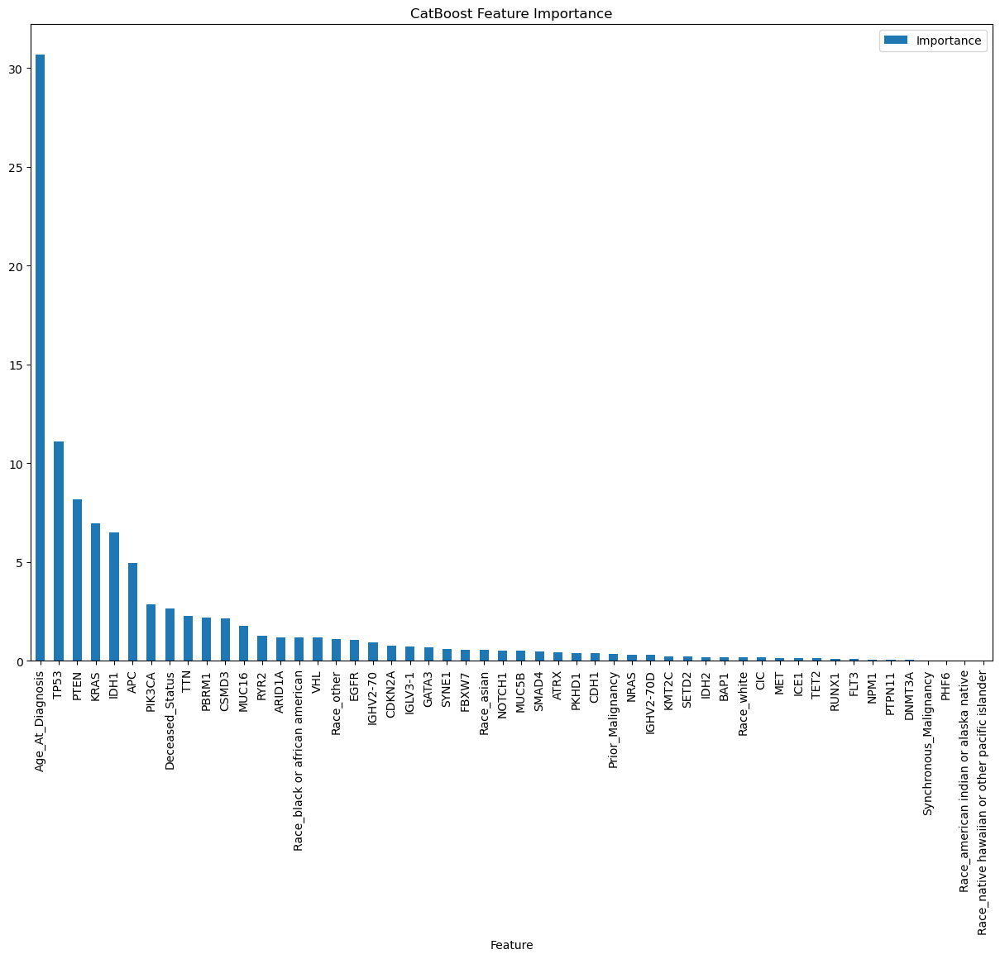

In [50]:
cat_feature_importance_df.plot(kind='bar', 
                                title='CatBoost Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))